In [1]:
# Standard library
from pathlib import Path
import random
import re
import types

# Data manipulation and visualisation
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image

# PyTorch
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset, Subset
from torch.optim.lr_scheduler import CosineAnnealingLR
from torchvision import models, transforms
import torchvision.transforms.functional as transformFunctional

# Scikit-learn
from sklearn.metrics import (
    accuracy_score,
    balanced_accuracy_score,
    f1_score,
)
from sklearn.model_selection import StratifiedKFold, train_test_split
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

In [2]:
###################################################
#1.1 load the data into a dataframe
###################################################

DATASET_ROOT = Path("../data_resized/")

pat = re.compile(
    r"^(?P<actor>[^_]+)_(?P<action>.+)_HD_instance(?P<instance>\d+)_(?P<frame>\d+)\.png$",
    re.I,
)

rows = []
for p in sorted(DATASET_ROOT.rglob("*.png")):
    if "__MACOSX" in p.parts or p.name.startswith("._"):
        continue  # ignore archive artefacts
    m = pat.match(p.name)
    if not m:
        continue
    rows.append(
        dict(
            path=str(p),
            gesture=p.relative_to(DATASET_ROOT).parts[
                0
            ],  # label = top-level folder
            actor=m["actor"],
            instance=int(m["instance"]),
            frame=int(m["frame"]),
            instance_uid=f'{m["actor"]}|{p.relative_to(DATASET_ROOT).parts[0]}|{m["instance"]}',
        )
    )

df = pd.DataFrame(rows)
print(f"frames    : {len(df)}")
print(f"instances : {df['instance_uid'].nunique()}")
print(f"actors    : {df['actor'].nunique()}")
print(f"classes   : {df['gesture'].nunique()}")

# integrity check: every instance should have exactly 5 frames
bad = df.groupby("instance_uid")["frame"].nunique()
assert (
    bad == 5
).all(), f"instances without exactly 5 frames: {bad[bad != 5].index.tolist()}"
print("OK: every instance has 5 frames")

frames    : 5295
instances : 1059
actors    : 11
classes   : 13
OK: every instance has 5 frames


+ The total number of samples is very small only being 1059 sets of 5 sequences

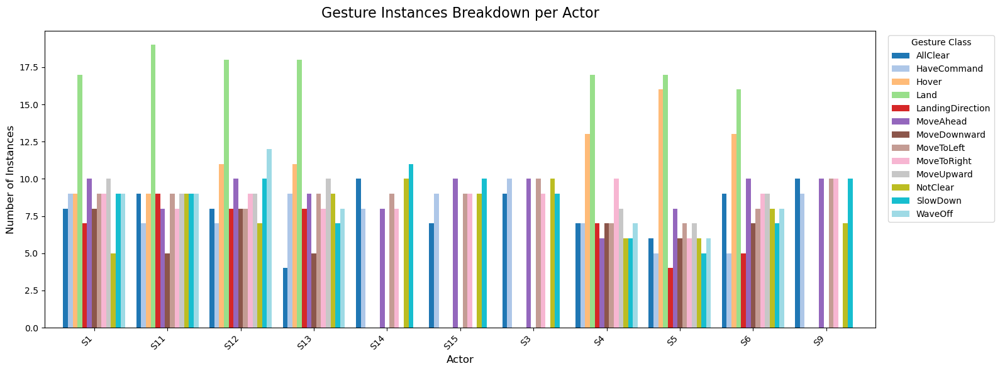

In [7]:
#see the breakdown of actor per classes
# Keep only one row per instance to count sequences, not frames - no need to count each frame of a sequence
df_instances = df.drop_duplicates(subset='instance_uid')

#group data by Actor and Gesture, and count number of occurrences
actor_class_counts = df_instances.groupby(['actor', 'gesture']).size().unstack()

#plot a grouped bar chart
ax = actor_class_counts.plot(
    kind='bar', 
    stacked=False, 
    figsize=(16, 6), 
    width=0.85, 
    colormap='tab20' #colormap -> different colour for each class
)

#format the chart
plt.title('Gesture Instances Breakdown per Actor', fontsize=16, pad=15)
plt.xlabel('Actor', fontsize=12)
plt.ylabel('Number of Instances', fontsize=12)
plt.xticks(rotation=45, ha='right') #angle actor names

# Move the legend outside the plot so it doesn't cover the bars
plt.legend(title='Gesture Class', bbox_to_anchor=(1.01, 1), loc='upper left')

#add the legend and show plot
plt.tight_layout()
plt.show()

+ The distribution of actors and sequences shows that some actors performed more gestures than others. This is an important discovery because if the model begins to associate specific actors with specific gestures, it may rely on actor identity rather than the motion itself. We need to ensure that actor-specific traits are not factored into the predictions. Cross-validation considering actors as groups may be a good candidate for training, as it can help limit the bias caused by the same actor contributing a greater proportion of the sequences.
+ The training set is very small, with only 635 samples.
+ As there are not many samples available to provide the model with adequate training, this problem is a good candidate for applying augmentation to increase the effective size and diversity of the training set.

In [8]:
##############################
#1.2 setup up data to tensor
##############################

# Custom PyTorch Dataset for loading gesture sequences.
# Each dataset item corresponds to one gesture instance consisting of
# five ordered image frames. The class groups images by `instance_uid`,
# sorts them into order, optionally applies the same data
# augmentation to every frame in the sequence, converts the frames into
# tensors, and returns a tensor of shape (5, C, H, W) with its label.
class GestureSequenceDataset(Dataset):
    def __init__(self, dataframe, transform=None, aug_level=None):
        #group by instance so each index grabs 1 sequence of images
        self.instances = list(dataframe.groupby('instance_uid'))
        self.transform = transform
        self.aug_level = aug_level
        
    def __len__(self):
        #Returns the length of instances
        return len(self.instances)
    
    def __getitem__(self, idx):
        #get the row data
        uid, instance_df = self.instances[idx]
        instance_df = instance_df.sort_values('frame')

        #frames in the sequence have the same label
        label_str = instance_df.iloc[0]['gesture']
        label = class_to_idx[label_str]

        #load orig images
        orig_frames = []
        for _, row in instance_df.iterrows():
                orig_frames.append(Image.open(row['path']).convert("RGB"))

        frames = []
        #apply augmentation if passed in
        if self.aug_level in ['light', 'medium', 'strong']:
            #keep it so the sequence is updated with the same augmentation 
            params = PARAM_SAMPLERS[self.aug_level](label_str)
            #apply to all frames in sequence
            for img in orig_frames:
                aug_img = apply_params_to_frame(img, params)                    
                frames.append(aug_img)

        else:
            #when no aug standard transform
            for img in orig_frames:
                if self.transform:
                    img = self.transform(img)
                frames.append(img)

        #stack the five frames into a single tensor shape (5, C, H, W)
        sequence_tensor = torch.stack(frames)

        return sequence_tensor, label

#plot experiments
def plot_experiments(results, show_train=True, show_val=True):
    """Plot training and validation loss + accuracy for multiple experiments."""
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    # Loss
    ax = axes[0]
    for name, hist in results.items():
        epochs = range(1, len(hist['train_loss']) + 1)
        if show_train:
            ax.plot(epochs, hist['train_loss'], label=f'{name} (Train)', marker='o', markersize=4)
        if show_val:
            ax.plot(epochs, hist['val_loss'], label=f'{name} (Val)', marker='x', markersize=4, linestyle='--')
    ax.set_xlabel('Epoch')
    ax.set_ylabel('Loss')
    ax.set_title('Loss')
    ax.legend(fontsize=8)
    ax.grid(True, linestyle='--', alpha=0.7)

    # Accuracy
    ax = axes[1]
    for name, hist in results.items():
        epochs = range(1, len(hist['train_acc']) + 1)
        if show_train:
            ax.plot(epochs, hist['train_acc'], label=f'{name} (Train)', marker='o', markersize=4)
        if show_val:
            ax.plot(epochs, hist['val_acc'], label=f'{name} (Val)', marker='x', markersize=4, linestyle='--')
    ax.set_xlabel('Epoch')
    ax.set_ylabel('Accuracy')
    ax.set_title('Accuracy')
    ax.legend(fontsize=8)
    ax.grid(True, linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.show()



#NEEDS TO BE FILLED IN
#NEEDS TO BE FILLED IN
#NEEDS TO BE FILLED IN
#NEEDS TO BE FILLED IN
######################################################################################################################################
#5. Defined Performance Targets
######################################################################################################################################
#NEEDS TO BE FILLED IN

#Goals

+ High performance on gesture classification:

  Accurately classify the 13 gestures using information from all five frames of the sequence.

+ Balanced performance across all classes:

  The model must perform consistently across all classes, as an incorrect classification could result in an incorrect action that impacts the behaviour of the drone.

+ Robustness to real-life conditions and safety:

  As the drone could operate at different times of the day, visibility may be lower and weather conditions may change, potentially affecting the background, lighting and colours. The drone could also operate in different locations, meaning the background may contain different colours, shapes, horizon lines and ground features. Given that the images are captured by a camera assumed to be mounted on the drone itself, there is also the possibility of misfocus, changes in image depth and other variations between the five frames. The model should therefore be able to perform reliably under these real-world conditions while minimising misclassifications to support safe operation.

+ Generalise to unseen examples:

  The model should be able to effectively predict gestures on samples that it has not seen before. This is necessary for the model to be considered production ready. The results should also be reproducible so that performance is verifiable and supported through experimentation. The model must learn the movements associated with each gesture rather than relying on characteristics of the operators performing them, such as their clothing or appearance, or on the backgrounds present in the training set.

+ Low inference cost:

  As the model needs to run onboard the drone, the available computational resources will be limited. Therefore, the model should be sufficiently small and computationally efficient to allow real time inference on the drone's hardware.

+ Use all frames effectively:

  As each gesture can take up to five frames to play out, the model should effectively use information from all five images in the sequence to make an accurate prediction of the gesture being performed.

+ Performance metrics:

As the dataset is not balanced across the classes, entropy loss alone may not be a reliable guide to overall performance, as it primarily optimises the classification objective and, in an imbalanced dataset, the model may become biased towards predicting the more common classes. Stratification will therefore be applied across the training set to maintain a representative distribution of the categories in each split. This will help ensure that the smaller represented classes are still represented in each training split and are not missed due to their small number of instances.

Class-weighted entropy loss will be used during training to give greater importance to the less represented classes. By applying a weighting to the entropy loss, errors on less represented classes will be penalised more heavily, helping to reduce the effect of class imbalance during training. The entropy loss can then be used to measure how well the model is learning by monitoring the loss at each epoch and providing an indication of the training process, such as whether the model is underfitting or overfitting and how close the model might be to convergence.

Accuracy will also be used to measure the number of correct predictions compared to the total number of predictions. However, because the dataset is imbalanced, accuracy alone may not provide a complete representation of performance across all 13 gestures.

The Macro F1-score will therefore also be used, as it gives each of the 13 gestures equal importance, making it particularly useful for the imbalanced dataset. The F1-score for each class is calculated from its precision and recall, providing a balance between how accurately the model predicts a class and how many of the actual examples of that class it correctly identifies. The Macro F1-score then calculates the average F1-score across all 13 classes, giving every gesture the same contribution to the final score regardless of how many samples belong to that class. This means that a "low performing MINORITY class" will have the same impact on the Macro F1-score as a "low performing MAJORITY class", this provides a better indication as to whether the model is performing consistently across all gestures.





'''A target value defines when development stops. Set it using literature benchmarks, domain requirements, and baseline performance.

Known Benchmarks for Intel Image Classification
Approach	Accuracy
Random guessing (6 classes)	~16.7%
Simple CNN (no tuning)	~75–80%
CNN + augmentation + regularisation	~85–88%
ResNet-50 transfer learning (fine-tune)	~91%
ResNet-34 + 1-cycle + fine-tune	~94%
Sources: Kaggle notebooks, GitHub repos, various blog posts

Key confusions reported in literature:

glacier ↔ mountain (both have snow)
buildings ↔ street (both are urban)
sea ↔ glacier (blue/white tones)
forest is easiest to classify (distinctive green)


Justification (fill in):

Why this metric?

Why this target value?


#.....'''

# ============================================
# DEFINE YOUR TARGETS HERE
# ============================================

TARGET_METRIC = 'accuracy'  # TODO: Choose and justify
TARGET_VALUE = 0.88         # TODO: Set a realistic target value

print(f'Target metric: {TARGET_METRIC}')
print(f'Target value:  {TARGET_VALUE:.1%}')

In [4]:
###################################################
#1.3 transform learning - functions
###################################################
device = torch.device('cuda' if torch.cuda.is_available() else 'mps' if torch.backends.mps.is_available() else 'cpu')


# ImageNet normalisation (required for pretrained models)
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]

#standard transform
#specific standard transform for validation set
#keeping this augmentation free
seq_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD),
])




#resnet 18

#forward pass (Batch, Sequence, Channels, Height, Width)
def sequence_forward_late_fusion(self, x):
    
    B, seq_len, C, H, W = x.size()
    #flatten batch and sequence dimensions
    x = x.view(B * seq_len, C, H, W)
    #pass through forward method
    out = self.base_forward(x)
    #reshape back to sequences and average the predictions across the 5 frames - late fusion
    out = out.view(B, seq_len, -1)
    out = out.mean(dim=1) 
    
    return out


def sequence_forward_early_fusion(self, x):
    B, seq_len, C, H, W = x.size()

    # Stack the 5 RGB frames into the channel dimension
    # (B, 5, 3, H, W) -> (B, 15, H, W)
    x = x.view(B, seq_len * C, H, W)

    # Single CNN pass
    out = self.base_forward(x)

    return out

    
#ResNet18 model, override forward method for sequences
def create_resnet18_lf(num_classes, dropout_rate=0.0):
    
    #load ResNet18
    model = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)

    #add in features
    in_features = model.fc.in_features

    #inject drop out into classification head
    if dropout_rate > 0:
        model.fc = nn.Sequential(
            nn.Dropout(p=dropout_rate),
            nn.Linear(in_features, num_classes)
        )
    else:
        #replace the final linear layer
        model.fc = nn.Linear(in_features, num_classes)
        
    #save the orig forward method
    model.base_forward = model.forward
    #bind specific impl sequence_forward_late_fusion function to this model instance
    model.forward = types.MethodType(sequence_forward_late_fusion, model)
    
    return model

#ResNet18 model, override forward method for sequences - early fusion
def create_resnet18_ef(num_classes):
    
    #load ResNet18
    model = models.resnet18(
        weights=models.ResNet18_Weights.IMAGENET1K_V1
    )

    # Save pretrained 3-channel convolution
    old_conv = model.conv1

    # Create 15-channel convolution
    model.conv1 = nn.Conv2d(
        15,
        64,
        kernel_size=7,
        stride=2,
        padding=3,
        bias=False
    )

    # Copy pretrained weights into each RGB frame
    with torch.no_grad():
        model.conv1.weight[:, 0:3] = old_conv.weight
        model.conv1.weight[:, 3:6] = old_conv.weight
        model.conv1.weight[:, 6:9] = old_conv.weight
        model.conv1.weight[:, 9:12] = old_conv.weight
        model.conv1.weight[:, 12:15] = old_conv.weight

    # Replace classifier
    model.fc = nn.Linear(model.fc.in_features, num_classes)

    # Save original forward
    model.base_forward = model.forward

    # Override forward
    model.forward = types.MethodType(sequence_forward_early_fusion, model)

    
    return model

#all layers except fully connected (fc)
def freeze_backbone(model):
    for name, param in model.named_parameters():
        if 'fc' not in name:
            param.requires_grad = False

def unfreeze_backbone(model):
    for param in model.parameters():
        param.requires_grad = True

def count_params(model):
    trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
    total = sum(p.numel() for p in model.parameters())
    print(f'  Trainable: {trainable:,} / {total:,} ({trainable/total*100:.2f}%)')


+ instead of training a 2d CNN from scratch - filtering and pooling, instead as apart of the baseline for tis experiment a pretrained model will be used. The pretrained model selected is Resnet18
  because it it has laready learned from the ImageNet dataset and this can be used to adapt to the gesture classification. ImageNet has over million images accross 1,000 classes and is also a 2d cnn
  which fits the constraints of the problem. This is to limit overfitting, low acccuracy and slow convergance  (He et al., 2016)
+ Although Resnet-18 is 11.7 million parameters shrinking the final full-connected (MLP) from 1,000 classes to 13 will save about 500,000 paramters.
  (Input Features × Output Features) + Biases (one per output)
  Standard ImageNet ResNet-18 (1,000 classes):
  Weights: 512 input features × 1,000 output classes = 512,000
  Biases: 1,000
  Total: 513,000 parameters

  Custom RedKite Drone ResNet-18 (13 classes):
  Weights: 512 input features × 13 output classes = 6,656
  Biases: 13
  Total: 6,669 parameters
  
  
+ By stacking the sequence of five frames together, a standard RGB image with 3 channels becomes a 15-channel input tensor (5 frames × 3 channels). Modifying the first input layer of ResNet-18 to accept a 15-channel tensor allows the entire sequence to be processed in a single inference pass.

This early fusion approach reduces inference time compared to late fusion, where each frame is processed independently through the network and the outputs are averaged or combined after five separate inference passes.

For ResNet-18, the first convolutional layer uses 64 output channels with a 7 × 7 kernel (Zhang et al., 2024). The number of parameters in the first convolutional layer is calculated as:

(Input Channels×Output Channels×Kernel Height×Kernel Width)+Biases

15-channel input (5 stacked frames):

15×64×7×7=47,040 parameters

Single 3-channel image input:

3×64×7×7=9,408 parameters

Processing five images independently with late fusion results in:

5×9,408=47,040 parameters

Therefore, both approaches use 47,040 parameters in the first convolutional layer. However, late fusion requires five separate inference passes, while early fusion processes all five frames in one inference pass. This makes the early fusion approach more computationally efficient and better suited for real-time live-stream gesture inference, where minimizing latency is important.


In [5]:
###################################################
#2. set up train/validation and test split
###################################################

#set up the data, transform to a tensor and organise training and test data
#20% is test and 80% are training
#Extract class names and create a mapping to integers
CLASS_NAMES = sorted(df['gesture'].unique().tolist())
class_to_idx = {cls_name: i for i, cls_name in enumerate(CLASS_NAMES)}
#Split by 'instance_uid' frames from the same sequence
unique_instances = df['instance_uid'].unique()

#1. split: 80% Temporary Training, 20% Test
train_instances, test_instances = train_test_split(
    unique_instances, test_size=0.20, random_state=42
)

#2. split: Split the 80% into Train (75% of 80% = 60%) and Validation (25% of 80% = 20%)
train_instances, val_instances = train_test_split(
    train_instances, test_size=0.25, random_state=42
)

#3. filter the DataFrame for each split
train_df = df[df['instance_uid'].isin(train_instances)].reset_index(drop=True)
val_df   = df[df['instance_uid'].isin(val_instances)].reset_index(drop=True)
test_df  = df[df['instance_uid'].isin(test_instances)].reset_index(drop=True)


#4. instantiate all three Datasets
train_ds = GestureSequenceDataset(train_df, transform=seq_transform, aug_level=None)
val_ds   = GestureSequenceDataset(val_df,   transform=seq_transform, aug_level=None)
test_ds  = GestureSequenceDataset(test_df,  transform=seq_transform, aug_level=None)


#add additional augmentation transforms
train_ds_aug_light = GestureSequenceDataset(train_df, transform=seq_transform, aug_level='light') + train_ds
train_ds_aug_medium = GestureSequenceDataset(train_df, transform=seq_transform, aug_level='medium') + train_ds
train_ds_aug_strong = GestureSequenceDataset(train_df, transform=seq_transform, aug_level='strong') + train_ds

print(f'Training:   {len(train_ds)} sequences ({len(train_df)} frames)')
print(f'Training Aug Light:   {len(train_ds_aug_light)} sequences')
print(f'Training Aug Med:   {len(train_ds_aug_medium)} sequences')
print(f'Training Aug Str:   {len(train_ds_aug_strong)} sequences')
print(f'Validation: {len(val_ds)} sequences ({len(val_df)} frames)')
print(f'Test:       {len(test_ds)} sequences ({len(test_df)} frames) (DO NOT TOUCH until final evaluation)')
print(f'Classes:    {CLASS_NAMES}')



Training:   635 sequences (3175 frames)
Training Aug Light:   1270 sequences
Training Aug Med:   1270 sequences
Training Aug Str:   1270 sequences
Validation: 212 sequences (1060 frames)
Test:       212 sequences (1060 frames) (DO NOT TOUCH until final evaluation)
Classes:    ['AllClear', 'HaveCommand', 'Hover', 'Land', 'LandingDirection', 'MoveAhead', 'MoveDownward', 'MoveToLeft', 'MoveToRight', 'MoveUpward', 'NotClear', 'SlowDown', 'WaveOff']


+ When training, validating and testing the model it is important to split the data into training and test sets, this is to prevent leakage from the model seeing existing samples
  giving it an unfair advantage and knowing the result.
+ The split of the data is 20% of the full data set is the test and 80% is training. Of the traing data that is further split into 25% validation and 75% training.
+ The application of augmentation is done over the training set which is added to the existing traiing set that doubles the number of samples.
+ There are three Augmentation categories -> light, medium and strong. 

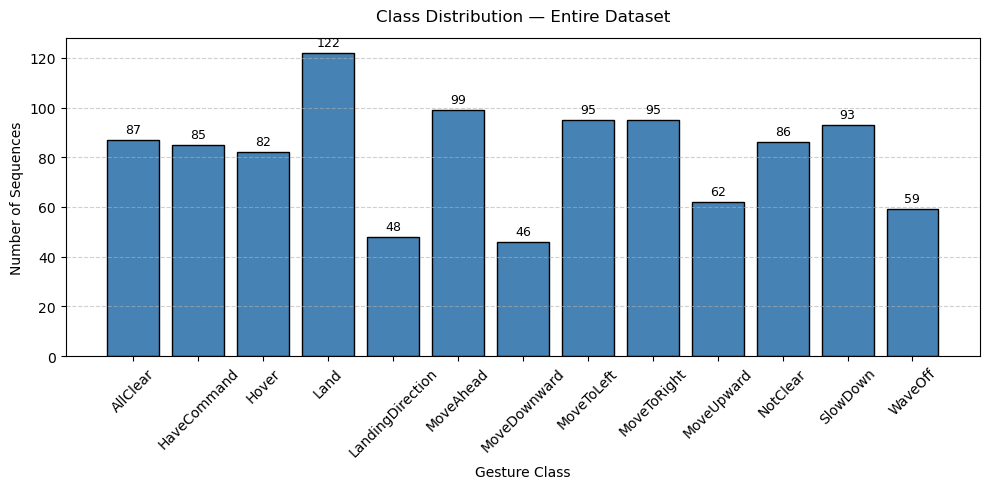

In [6]:
######################################################################################################
#3.1 Check the class distribution of the entire dataset
######################################################################################################
class_counts = df.groupby('gesture')['instance_uid'].nunique()

gestures = class_counts.index
counts = class_counts.values

# Plot the distribution
fig, ax = plt.subplots(figsize=(10, 5))
bars = ax.bar(gestures, counts, color='steelblue', edgecolor='black')

# Formatting
ax.set_title('Class Distribution — Entire Dataset', fontsize=12, pad=12)
ax.set_xlabel('Gesture Class', fontsize=10)
ax.set_ylabel('Number of Sequences', fontsize=10)
ax.tick_params(axis='x', rotation=45)
ax.grid(axis='y', linestyle='--', alpha=0.6)
ax.bar_label(bars, padding=3, fontsize=9)

plt.tight_layout()
plt.show()


The classes of the training set are not well balanced:

| Gesture | Count | Percentage |
|:---------|:------|:-----------|
| AllClear | 87 | 8.2% |
| HaveCommand | 85 | 8.0% |
| Hover | 82 | 7.7% |
| Land | 122 | 11.5% |
| LandingDirection | 48 | 4.5% |
| MoveAhead | 99 | 9.3% |
| MoveDownward | 46 | 4.3% |
| MoveToLeft | 95 | 9.0% |
| MoveToRight | 95 | 9.0% |
| MoveUpward | 62 | 5.9% |
| NotClear | 86 | 8.1% |
| SlowDown | 93 | 8.8% |
| WaveOff | 59 | 5.6% |
| **Total** | **1059** | **100%** |

+ landing direction, Move Downward, Move Upward, Waveoff are short
+ Land, Moveahead, MoeToleft and MoveToRight outnumber the rest
+ A strategy to address the imbalance of weighting on the dataset is to apply class weighting that is applied to each class.
  weight = total instances / (Number of Classes x Class Frequency)

  | Gesture | Count | Percentage | Class Weight | Notes |
|:------------------|:------|:-----------|:------------|:---------|
| MoveDownward | 46 | 4.3% | 1.77 | Largest penalty for errors |
| LandingDirection | 48 | 4.5% | 1.70 | |
| WaveOff | 59 | 5.6% | 1.38 | |
| MoveUpward | 62 | 5.9% | 1.31 | |
| Hover | 82 | 7.7% | 0.99 | |
| HaveCommand | 85 | 8.0% | 0.96 | |
| NotClear | 86 | 8.1% | 0.95 | |
| AllClear | 87 | 8.2% | 0.94 | |
| SlowDown | 93 | 8.8% | 0.88 | |
| MoveToLeft | 95 | 9.0% | 0.86 | |
| MoveToRight | 95 | 9.0% | 0.86 | |
| MoveAhead | 99 | 9.3% | 0.82 | |
| Land | 122 | 11.5% | 0.67 | Smallest penalty for errors |
| **Total** | **1059** | **100%** |  | |

+ Loss Penalty: calculated weights into a Cross-Entropy loss function will enable the model to penalise under represented classes more severly,
   in turn adding signifigance to the model training in relation to stronger represented classes.

+ As the classes are not balanced macro-F1 or balanced accuracy preferred over accuracy as it views classes equally:
  Standard Accuracy: Total Correct Predictions / Total Predictions (Which leads to more represented classes taking a bigger piece of the pie)
  Balanced Accruacy: Calculates individual recall per class seperately. Sums the 13 percentages together, divids by 13 for the unweighted arithmetic mean.
  Macro-F1: For each of the 13 classes, precision and recall calculated seperatley. Harmonic mean: 2 x ((precision x Recall) / (Precision + Recall)).
  the 13 individual F1 scores are summed and divided by 13. It will measure the model on how well it accutely counts including smaller categories such as WaveOff (Mullamuri, 2025)

+ StratifiedKFold will enable that the training and validation chunks will mirror the overall datasets class distruibution, so each fold preserves class proportions. It will aid in preventing small
  class distributions from being accidentally excluded from the validation fold.


Tensor -> ndim: 3, shape: torch.Size([512, 512, 3])


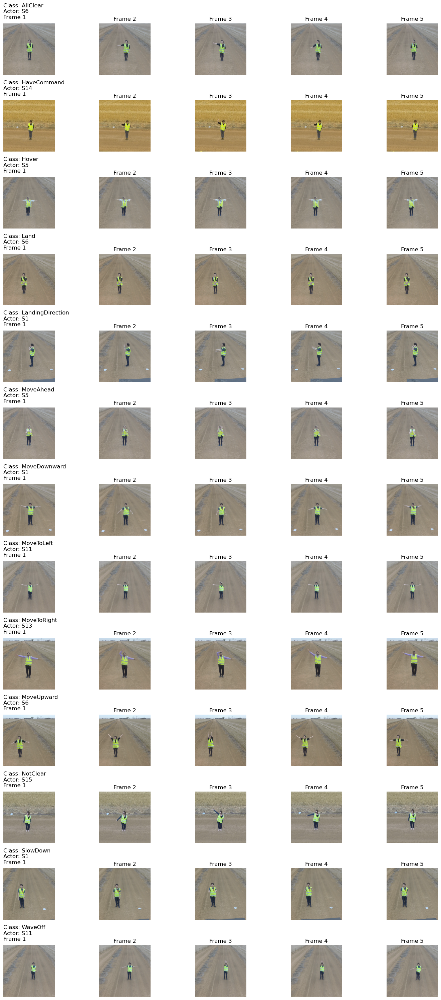

In [ ]:
######################################################################################################
#3.2 randomly load a set up images as a tensor to see how the they look like
######################################################################################################

#get 13 unique gesture classes, sort a-z
classes = sorted(df['gesture'].unique())
#create fig A. 13 rows and 5 frames
fig, axes = plt.subplots(nrows=len(classes), ncols=5, figsize=(15, 30))

#set to false to not print each time
printed_tensor_stats = False

#iterate through
for i, gesture in enumerate(classes):
    gesture_df = df[df['gesture'] == gesture]
    #get random instance
    random_instance = np.random.choice(gesture_df['instance_uid'].unique())
    #and 5 rows
    instance_df = gesture_df[gesture_df['instance_uid'] == random_instance].sort_values('frame')
    #grab the five sequence and plot
    for j, (_, row) in enumerate(instance_df.iterrows()):
        ax = axes[i, j]

        #load into PIL
        pil_img = Image.open(row['path'])
        #into numpy array, and pytorch
        np_image = np.array(pil_img)
        tensor_image = torch.as_tensor(np_image)
        
        #display the image
        if not printed_tensor_stats:
            print(f"Tensor -> ndim: {tensor_image.ndim}, shape: {tensor_image.shape}")
            printed_tensor_stats = True
        
        ax.imshow(np_image)
        ax.axis('off')
        #add in the titles
        if j == 0:
            ax.set_title(f"Class: {gesture}\nActor: {row['actor']}\nFrame {row['frame']}", fontsize=12, loc='left', pad=10)
        else:
            ax.set_title(f"Frame {row['frame']}", fontsize=12)
#format evenly the layout
plt.tight_layout()
plt.show()



What can be noticed from the randomly selected sequence subsets of each action is that:
+ the people doing the gestures are at different distances, some are closer and others are further away -
  This is an important observation as we do not want our model to predict the gesture based on the size or aspect of the sequence
+ the background in these images are different and change colour although some share the same backdrop and we do not want that to be considered by the model
+ Some of the sequences have small circulare objects that appear to be cones perhaps for disgnating areas and we don't want those to be a factor in our model also
+ the operators performing the gestures in the samples are not always in the centre of the shot and the model should be able to cater for this
+ Classes: AllClear and LandingDirection have to one side and creating the wrong augmentation could confuse the model

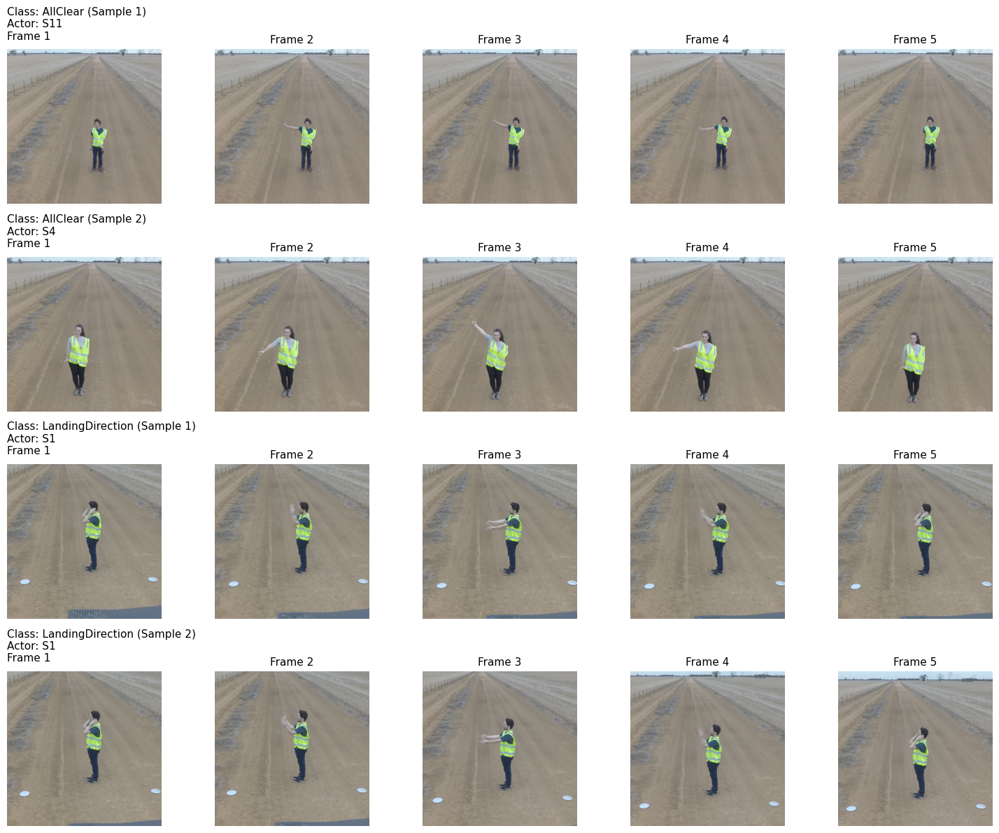

In [8]:
######################################################################################################################################
#3.3 check some more samples from LandingDirection, All clear confirm that gestures are consistantly to the same side and not random
######################################################################################################################################

#Plots 2 random sequences for specific one-sided gestures 
#to visually verify orientation before defining augmentations.

def verify_asymmetric_gestures(dataframe):
   
    target_classes = ['AllClear', 'LandingDirection']
    samples_per_class = 2
    
    # Create figure: 4 rows (2 classes * 2 samples), 5 columns
    total_rows = len(target_classes) * samples_per_class
    fig, axes = plt.subplots(nrows=total_rows, ncols=5, figsize=(15, 3 * total_rows))
    
    row_idx = 0
    for gesture in target_classes:
        # Filter for the specific gesture
        gesture_df = dataframe[dataframe['gesture'] == gesture]
        available_instances = gesture_df['instance_uid'].unique()
        
        # Pick 2 unique random instances
        if len(available_instances) >= samples_per_class:
            random_instances = np.random.choice(available_instances, size=samples_per_class, replace=False)
        else:
            random_instances = available_instances # Fallback if very little data
            
        for sample_num, instance_uid in enumerate(random_instances, start=1):
            # Extract and sort the 5 frames
            instance_df = gesture_df[gesture_df['instance_uid'] == instance_uid].sort_values('frame')
            
            for j, (_, row) in enumerate(instance_df.iterrows()):
                ax = axes[row_idx, j]
                
                # Load and plot image
                pil_img = Image.open(row['path'])
                np_image = np.array(pil_img)
                
                ax.imshow(np_image)
                ax.axis('off')
                
                # Titles
                if j == 0:
                    ax.set_title(
                        f"Class: {gesture} (Sample {sample_num})\n"
                        f"Actor: {row['actor']}\n"
                        f"Frame {row['frame']}", 
                        fontsize=11, loc='left', pad=10
                    )
                else:
                    ax.set_title(f"Frame {row['frame']}", fontsize=11)
            
            row_idx += 1

    plt.tight_layout()
    plt.show()

# Run the verification function
verify_asymmetric_gestures(df)


In [9]:
#####################
#4.1 Training Utilities
#####################

#Training Utilities
def train_one_epoch(model, loader, optimizer, criterion):
    model.train()
    total_loss = 0.0
    correct, total = 0, 0

    for x, y in loader:
        x, y = x.to(device), y.to(device)

        outputs = model(x)
        loss = criterion(outputs, y)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item() * y.size(0)
        _, predicted = torch.max(outputs, 1)
        correct += (predicted == y).sum().item()
        total += y.size(0)
        
    #training loss: total_loss / total
    #training accuracy: correct / total
    return total_loss / total, correct / total


def evaluate(model, loader, criterion):
    model.eval()
    total_loss = 0.0
    correct, total = 0, 0

    with torch.inference_mode():
        for x, y in loader:
            x, y = x.to(device), y.to(device)
            outputs = model(x)
            loss = criterion(outputs, y)

            total_loss += loss.item() * y.size(0)
            _, predicted = torch.max(outputs, 1)
            correct += (predicted == y).sum().item()
            total += y.size(0)

    return total_loss / total, correct / total


def run_experiment(model, optimizer, criterion, train_loader, val_loader,
                   epochs=10, name='Model', scheduler=None):
    #Run training experiment, return history dict
    history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': []}

    for epoch in range(epochs):
        train_loss, train_acc = train_one_epoch(model, train_loader, optimizer, criterion)
        val_loss, val_acc = evaluate(model, val_loader, criterion)

        history['train_loss'].append(train_loss)
        history['train_acc'].append(train_acc)
        history['val_loss'].append(val_loss)
        history['val_acc'].append(val_acc)

        if (epoch + 1) % max(1, epochs // 5) == 0 or epoch == 0:
            print(f'  [{name}] Epoch {epoch+1}/{epochs} — '
                  f'Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f} | '
                  f'Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}')

    return history

In [10]:
###############################################################################
#4.2 print_evaluation_metrics
###############################################################################

##############################################################
# accuracy function that returns the accuracy metrics
# As the classes are not balanced macro-F1 or balanced accuracy preferred over accuracy
# standard accuracy, balanced accuracy, macro-F1 score
##############################################################


def print_evaluation_metrics(metrics_list):

    results = []

    for inst in metrics_list:
        
        
        model = inst['model']
        train_loader = inst['train_loader']
        val_loader = inst['val_loader']
        device = inst['device']
        model_name = inst['name']

        model.eval() # Set model to evaluation mode
        
        def get_predictions(loader):
            all_preds = []
            all_labels = []
            # no need for gradient calculation in inference
            with torch.no_grad(): 
                for inputs, labels in loader:
                    inputs = inputs.to(device)
                    
                    #fwd pass
                    outputs = model(inputs)
                    
                    #get the predicted class -> highest logit/prob
                    _, preds = torch.max(outputs, 1)
                    
                    #move back to CPU, convert to numpy
                    all_preds.extend(preds.cpu().numpy())
                    all_labels.extend(labels.cpu().numpy())
                    
            return all_labels, all_preds
    
        #get labels and predictions for both splits
        train_y, train_pred = get_predictions(train_loader)
        val_y, val_pred = get_predictions(val_loader)

        results.append({
            'name': model_name,
            'train_acc': accuracy_score(train_y, train_pred),
            'val_acc': accuracy_score(val_y, val_pred),
            'train_bal_acc': balanced_accuracy_score(train_y, train_pred),
            'val_bal_acc': balanced_accuracy_score(val_y, val_pred),
            'train_f1': f1_score(train_y, train_pred, average='macro'),
            'val_f1': f1_score(val_y, val_pred, average='macro')
        })
        

    header1 = f"{'':<20}"
    header2 = f"{'Metric':<20}"

    for res in results:
        header1 += f" | {res['name']:<23}"
        header2 += f" | {'Train':<10} | {'Validation':<10}"
        
    line_len = len(header1)
    
    print(f"\n{'-'*line_len}")
    print(header1)
    print(header2)
    print(f"{'-'*line_len}")

    row_acc = f"{'Standard Accuracy':<20}"
    row_bal = f"{'Balanced Accuracy':<20}"
    row_f1  = f"{'Macro F1 Score':<20}"
    
    for res in results:
        row_acc += f" | {res['train_acc']:<10.3f} | {res['val_acc']:<10.3f}"
        row_bal += f" | {res['train_bal_acc']:<10.3f} | {res['val_bal_acc']:<10.3f}"
        row_f1  += f" | {res['train_f1']:<10.3f} | {res['val_f1']:<10.3f}"

    print(row_acc)
    print(row_bal)
    print(row_f1)
    print(f"{'-'*line_len}\n")
    

In [11]:
###################################################
#5. split the train_df into subsets
###################################################

torch.manual_seed(42)

#batch_size=16 means 16 sequences * 5 frames = 80 images per batch
train_loader = DataLoader(train_ds, batch_size=16, shuffle=True, num_workers=2, pin_memory=True)
train_loader_al = DataLoader(train_ds_aug_light, batch_size=16, shuffle=True, num_workers=2, pin_memory=True)
train_loader_am = DataLoader(train_ds_aug_medium, batch_size=16, shuffle=True, num_workers=2, pin_memory=True)
train_loader_as = DataLoader(train_ds_aug_strong, batch_size=16, shuffle=True, num_workers=2, pin_memory=True)

#validation never changes, no augmentation
val_loader = DataLoader(val_ds, batch_size=16, shuffle=False, num_workers=2, pin_memory=True)

In [12]:
###################################################
#6.1 stratifiedKFold_processing - just frozen
###################################################

import copy
from torch.utils.data import Subset, ConcatDataset


def stratifiedKFold_processing(model, name, train_df, seq_transform, aug_level, val_epoch, criterion):
    results = {}
    num_splits = 5
    skf = StratifiedKFold(n_splits=num_splits, shuffle=True, random_state=42)
    
    cv_models = []
    cv_loaders = []
    fold_results_list = [] #to hold each fold and then will be used to average

    #Extract UIDs and their corresponding gesture labels for stratification
    unique_uids = train_df['instance_uid'].unique()
    sequence_labels = []

    
    for uid in unique_uids:
        # Grab the first row for this UID to find its class
        label_str = train_df[train_df['instance_uid'] == uid]['gesture'].iloc[0]
        sequence_labels.append(class_to_idx[label_str])
        
    
    for fold, (train_idx, val_idx) in enumerate(skf.split(unique_uids, sequence_labels)):
        print(f"\nTarget fold {fold + 1}/{num_splits}")

        #get the UIDs for train and val for this specific fold
        train_uids = unique_uids[train_idx]
        val_uids = unique_uids[val_idx]

        fold_train_df = train_df[train_df['instance_uid'].isin(train_uids)].reset_index(drop=True)
        fold_val_df = train_df[train_df['instance_uid'].isin(val_uids)].reset_index(drop=True)

        #validation is un-augmented
        val_fold_ds = GestureSequenceDataset(fold_val_df, transform=seq_transform, aug_level=None)

        #training gets the base images
        train_fold_base = GestureSequenceDataset(fold_train_df, transform=seq_transform, aug_level=None)

        if aug_level is not None:
            train_fold_aug = GestureSequenceDataset(fold_train_df, transform=seq_transform, aug_level=aug_level)
            train_fold_ds = ConcatDataset([train_fold_base, train_fold_aug])
        else:
            train_fold_ds = train_fold_base

        #create DataLoaders
        train_loader_fold = DataLoader(train_fold_ds, batch_size=16, shuffle=True, num_workers=2, pin_memory=True)
        val_loader_fold = DataLoader(val_fold_ds, batch_size=16, shuffle=False, num_workers=2, pin_memory=True)
        
        
        # Re-initialize model & optimizer per fold
        model_fold = copy.deepcopy(model) #deep copy is used to prevent leakage and reset the model weights for each iteration
        optimizer_fold = optim.Adam(model_fold.parameters(), lr=1e-3)
        
        # Run training for the fold
        fold_name = f'{name}_Fold_{fold + 1}'
        fold_res = run_experiment(
            model_fold, 
            optimizer_fold, 
            criterion, 
            train_loader_fold, 
            val_loader_fold,
            epochs=val_epoch, 
            name=name
        )
        fold_results_list.append(fold_res)
    
        # Store references for evaluation table
        cv_models.append(model_fold)
        cv_loaders.append((train_loader_fold, val_loader_fold))
    
    #compute the average are add to the results for kfold
    averaged_results = {}
    if fold_results_list:
        metric_keys = fold_results_list[0].keys()
    
        for key in metric_keys:
            averaged_results[key] = []
            for epoch_idx in range(val_epoch):
                epoch_values_across_folds = [fold[key][epoch_idx] for fold in fold_results_list]
    
                mean_val = sum(epoch_values_across_folds) / num_splits
                averaged_results[key].append(mean_val)
    
    results['CV_Avg'] = averaged_results

    return results, cv_models, cv_loaders


In [13]:
###############################################################################
#6.2 stratifiedKFold_processing_twostage -> two phases frozen and unfrozen
###############################################################################

def stratifiedKFold_processing_twostage(model, name, train_df, seq_transform, aug_level, p1_epochs, p2_epochs, ft_lr, wd, criterion, use_cosine=False):

    results = {}
    num_splits = 5
    skf = StratifiedKFold(n_splits=num_splits, shuffle=True, random_state=42)
    
    cv_models = []
    cv_loaders = []
    fold_results_list = [] #to hold each fold and then will be used to average

    #Extract UIDs and their corresponding gesture labels for stratification
    unique_uids = train_df['instance_uid'].unique()
    sequence_labels = []

    
    for uid in unique_uids:
        # Grab the first row for this UID to find its class
        label_str = train_df[train_df['instance_uid'] == uid]['gesture'].iloc[0]
        sequence_labels.append(class_to_idx[label_str])
        
    
    for fold, (train_idx, val_idx) in enumerate(skf.split(unique_uids, sequence_labels)):
        print(f"\nTarget fold {fold + 1}/{num_splits}")

        #get the UIDs for train and val for this specific fold
        train_uids = unique_uids[train_idx]
        val_uids = unique_uids[val_idx]

        fold_train_df = train_df[train_df['instance_uid'].isin(train_uids)].reset_index(drop=True)
        fold_val_df = train_df[train_df['instance_uid'].isin(val_uids)].reset_index(drop=True)

        #validation is un-augmented
        val_fold_ds = GestureSequenceDataset(fold_val_df, transform=seq_transform, aug_level=None)

        #training gets the base images
        train_fold_base = GestureSequenceDataset(fold_train_df, transform=seq_transform, aug_level=None)

        if aug_level is not None:
            train_fold_aug = GestureSequenceDataset(fold_train_df, transform=seq_transform, aug_level=aug_level)
            train_fold_ds = ConcatDataset([train_fold_base, train_fold_aug])
        else:
            train_fold_ds = train_fold_base

        #create DataLoaders
        train_loader_fold = DataLoader(train_fold_ds, batch_size=16, shuffle=True, num_workers=2, pin_memory=True)
        val_loader_fold = DataLoader(val_fold_ds, batch_size=16, shuffle=False, num_workers=2, pin_memory=True)
        
        
        # Re-initialize model & optimizer per fold
        model_fold = copy.deepcopy(model) #deep copy is used to prevent leakage and reset the model weights for each iteration
        
        ############################################################
        #STEP 1: frozen backbone for Linear Probing
        ############################################################
        freeze_backbone(model_fold)
        # Use standard LR for training the fresh classification head, WD=0
        optimizer_p1 = optim.Adam(filter(lambda p: p.requires_grad, model_fold.parameters()), lr=1e-3, weight_decay=0)
        
        # Run training for the fold
        print(f"  > Phase 1: Probing ({p1_epochs} epochs)")
        res_p1 = run_experiment(
            model_fold, 
            optimizer_p1, 
            criterion, 
            train_loader_fold, 
            val_loader_fold,
            epochs=p1_epochs, 
            name=f'{name}_Fold_{fold + 1}_P1'
        )

        ############################################################
        #STEP 2: FINE-TUNING -> Unfrozen Backbone
        ############################################################
        unfreeze_backbone(model_fold)

        optimizer_p2 = optim.Adam(model_fold.parameters(), lr=ft_lr, weight_decay=wd)

        #if use_cosine apply cosine learning rate decay
        if use_cosine:
            scheduler_p2 = CosineAnnealingLR(optimizer_p2, T_max=p2_epochs, eta_min=1e-7)
        else:
            scheduler_p2 = None

        print(f"  > Phase 2: Fine-Tuning ({p2_epochs} epochs)")
        res_p2 = run_experiment(
            model_fold, 
            optimizer_p2, 
            criterion, 
            train_loader_fold, 
            val_loader_fold,
            epochs=p2_epochs, 
            name=f'{name}_Fold_{fold + 1}_P2',
            scheduler=scheduler_p2
        )

        #merge in step 1 and step 2  dictionaries
        combined_res = {}
        for key in res_p1.keys():
            combined_res[key] = res_p1[key] + res_p2[key]
            
        fold_results_list.append(combined_res)

        # Store references for evaluation table
        cv_models.append(model_fold)
        cv_loaders.append((train_loader_fold, val_loader_fold))

    
    #compute the average are add to the results for kfold
    averaged_results = {}
    if fold_results_list:
        metric_keys = fold_results_list[0].keys()
        total_epochs = p1_epochs + p2_epochs
    
        for key in metric_keys:
            averaged_results[key] = []
            for epoch_idx in range(total_epochs):
                epoch_values_across_folds = [fold[key][epoch_idx] for fold in fold_results_list]
    
                mean_val = sum(epoch_values_across_folds) / num_splits
                averaged_results[key].append(mean_val)
    
    results['CV_Avg'] = averaged_results

    return results, cv_models, cv_loaders

In [14]:
###############################################################################
#6.3 stratifiedGroupKFold_onestage -> one phase frozen, actor groups
###############################################################################
def stratifiedGroupKFold_onestage(model, name, train_df, seq_transform, aug_level, epochs, criterion):
    results = {}
    num_splits = 5

    sgkf = StratifiedGroupKFold(n_splits=num_splits, shuffle=True, random_state=42)
    
    cv_models = []
    cv_loaders = []
    fold_results_list = [] # to hold each fold and then will be used to average

    # Extract UIDs and their corresponding gesture labels for stratification
    unique_uids = train_df['instance_uid'].unique()
    sequence_labels = []
    actor_groups = []
    
    for uid in unique_uids:
        # Grab the first row for this UID 
        first_row = train_df[train_df['instance_uid'] == uid].iloc[0]
        # append the label
        sequence_labels.append(class_to_idx[first_row['gesture']])
        # append the actor
        actor_groups.append(first_row['actor'])
        
    for fold, (train_idx, val_idx) in enumerate(sgkf.split(unique_uids, sequence_labels, groups=actor_groups)):
        print(f"\nTarget fold {fold + 1}/{num_splits}")

        # get the UIDs for train and val for this specific fold
        train_uids = unique_uids[train_idx]
        val_uids = unique_uids[val_idx]

        fold_train_df = train_df[train_df['instance_uid'].isin(train_uids)].reset_index(drop=True)
        fold_val_df = train_df[train_df['instance_uid'].isin(val_uids)].reset_index(drop=True)

        # validation is un-augmented
        val_fold_ds = GestureSequenceDataset(fold_val_df, transform=seq_transform, aug_level=None)

        # training gets the base images
        train_fold_base = GestureSequenceDataset(fold_train_df, transform=seq_transform, aug_level=None)

        if aug_level is not None:
            train_fold_aug = GestureSequenceDataset(fold_train_df, transform=seq_transform, aug_level=aug_level)
            train_fold_ds = ConcatDataset([train_fold_base, train_fold_aug])
        else:
            train_fold_ds = train_fold_base

        # create DataLoaders
        train_loader_fold = DataLoader(train_fold_ds, batch_size=16, shuffle=True, num_workers=2, pin_memory=True)
        val_loader_fold = DataLoader(val_fold_ds, batch_size=16, shuffle=False, num_workers=2, pin_memory=True)
        
        # Re-initialize model & optimizer per fold
        model_fold = copy.deepcopy(model) 
        
        ############################################################
        # STEP 1: frozen backbone for Linear Probing ONLY
        ############################################################
        freeze_backbone(model_fold)
        # Use standard LR for training the fresh classification head, WD=0
        optimizer = optim.Adam(filter(lambda p: p.requires_grad, model_fold.parameters()), lr=1e-3, weight_decay=0)
        
        # Run training for the fold
        print(f"  > Phase 1: Probing Only ({epochs} epochs)")
        res = run_experiment(
            model_fold, 
            optimizer, 
            criterion, 
            train_loader_fold, 
            val_loader_fold,
            epochs=epochs, 
            name=f'{name}_Fold_{fold + 1}'
        )

        fold_results_list.append(res)

        # Store references for evaluation table
        cv_models.append(model_fold)
        cv_loaders.append((train_loader_fold, val_loader_fold))

    # compute the average and add to the results for kfold
    averaged_results = {}
    if fold_results_list:
        metric_keys = fold_results_list[0].keys()
    
        for key in metric_keys:
            averaged_results[key] = []
            for epoch_idx in range(epochs):
                epoch_values_across_folds = [fold[key][epoch_idx] for fold in fold_results_list]
    
                mean_val = sum(epoch_values_across_folds) / num_splits
                averaged_results[key].append(mean_val)
    
    results['CV_Avg'] = averaged_results

    return results, cv_models, cv_loaders

In [15]:
###############################################################################
#6.4 stratifiedGroupKFold_onestage -> two phases frozen and unfrozen, actor groups
###############################################################################

#pass the actor groups into the split function allows for the shuffling of UIDs to look at the actor_groups array
#this allows folds to have the training not include the same actor as in the validation egsample:
#validation gets actor s3, training gets s1, s2 but not s3
#this ensures that the model is not being validated against a particular actor
######################################################################################################

import copy
from torch.utils.data import Subset
from sklearn.model_selection import StratifiedGroupKFold


def stratifiedGroupKFold_twostage(model, name, train_df, seq_transform, aug_level, p1_epochs, p2_epochs, ft_lr, wd, criterion, use_cosine=False):

    results = {}
    num_splits = 5

    sgkf = StratifiedGroupKFold(n_splits=num_splits, shuffle=True, random_state=42)
    
    cv_models = []
    cv_loaders = []
    fold_results_list = [] #to hold each fold and then will be used to average

    #Extract UIDs and their corresponding gesture labels for stratification
    unique_uids = train_df['instance_uid'].unique()
    sequence_labels = []
    #used to seperate the actors so that the validation set does not have the same actor init - this is to prevent the model from using the actor to infer a particular gesture
    actor_groups = []
    
    for uid in unique_uids:
        # Grab the first row for this UID 
        first_row = train_df[train_df['instance_uid'] == uid].iloc[0]
        #append the label
        sequence_labels.append(class_to_idx[first_row['gesture']])
        #append the actor
        actor_groups.append(first_row['actor'])
        
    #pass the actor groups into the split function allows for the shuffling of UIDs to look at the actor_groups array
    #this allows folds to have the training not include the same actor as in the validation egsample:
    #validation gets actor s3, training gets s1, s2 but not s3
    #this ensures that the model is not being validated against a particular actor
    for fold, (train_idx, val_idx) in enumerate(sgkf.split(unique_uids, sequence_labels, groups=actor_groups)):
        print(f"\ntarget fold {fold + 1}/{num_splits}")

        #get the UIDs for train and val for this specific fold
        train_uids = unique_uids[train_idx]
        val_uids = unique_uids[val_idx]

        fold_train_df = train_df[train_df['instance_uid'].isin(train_uids)].reset_index(drop=True)
        fold_val_df = train_df[train_df['instance_uid'].isin(val_uids)].reset_index(drop=True)

        #validation is un-augmented
        val_fold_ds = GestureSequenceDataset(fold_val_df, transform=seq_transform, aug_level=None)
        #training gets the base images
        train_fold_base = GestureSequenceDataset(fold_train_df, transform=seq_transform, aug_level=None)

        if aug_level is not None:
            train_fold_aug = GestureSequenceDataset(fold_train_df, transform=seq_transform, aug_level=aug_level)
            train_fold_ds = ConcatDataset([train_fold_base, train_fold_aug])
        else:
            train_fold_ds = train_fold_base

        #create DataLoaders
        train_loader_fold = DataLoader(train_fold_ds, batch_size=16, shuffle=True, num_workers=2, pin_memory=True)
        val_loader_fold = DataLoader(val_fold_ds, batch_size=16, shuffle=False, num_workers=2, pin_memory=True)
        
        
        # Re-initialize model & optimizer per fold
        model_fold = copy.deepcopy(model) #deep copy is used to prevent leakage and reset the model weights for each iteration
        
        ############################################################
        #STEP 1: frozen backbone for Linear Probing
        ############################################################
        freeze_backbone(model_fold)
        # Use standard LR for training the fresh classification head, WD=0
        optimizer_p1 = optim.Adam(filter(lambda p: p.requires_grad, model_fold.parameters()), lr=1e-3, weight_decay=0)
        
        # Run training for the fold
        print(f"  > Phase 1: Probing ({p1_epochs} epochs)")
        res_p1 = run_experiment(
            model_fold, 
            optimizer_p1, 
            criterion, 
            train_loader_fold, 
            val_loader_fold,
            epochs=p1_epochs, 
            name=f'{name}_Fold_{fold + 1}_P1'
        )

        ############################################################
        #STEP 2: FINE-TUNING -> Unfrozen Backbone
        ############################################################
        unfreeze_backbone(model_fold)

        optimizer_p2 = optim.Adam(model_fold.parameters(), lr=ft_lr, weight_decay=wd)

        if use_cosine:
            scheduler_p2 = CosineAnnealingLR(optimizer_p2, T_max=p2_epochs, eta_min=1e-7)
        else:
            scheduler_p2 = None
            
        print(f"  > Phase 2: Fine-Tuning ({p2_epochs} epochs)")
        res_p2 = run_experiment(
            model_fold, 
            optimizer_p2, 
            criterion, 
            train_loader_fold, 
            val_loader_fold,
            epochs=p2_epochs, 
            name=f'{name}_Fold_{fold + 1}_P2'
        )

        #merge in step 1 and step 2  dictionaries
        combined_res = {}
        for key in res_p1.keys():
            combined_res[key] = res_p1[key] + res_p2[key]
            
        fold_results_list.append(combined_res)

        # Store references for evaluation table
        cv_models.append(model_fold)
        cv_loaders.append((train_loader_fold, val_loader_fold))

    
    #compute the average are add to the results for kfold
    averaged_results = {}
    if fold_results_list:
        metric_keys = fold_results_list[0].keys()
        total_epochs = p1_epochs + p2_epochs
    
        for key in metric_keys:
            averaged_results[key] = []
            for epoch_idx in range(total_epochs):
                epoch_values_across_folds = [fold[key][epoch_idx] for fold in fold_results_list]
    
                mean_val = sum(epoch_values_across_folds) / num_splits
                averaged_results[key].append(mean_val)
    
    results['CV_Avg'] = averaged_results

    return results, cv_models, cv_loaders


In [16]:
# Step 1: Linear probing
NUM_CLASSES = len(CLASS_NAMES)
EPOCHS = 10

#calculate class weights dymnamically on train_df
#get the class weight based on label
unique_classes = np.unique(train_df['gesture'])
class_weights_np = compute_class_weight(
    class_weight='balanced', 
    classes=np.unique(train_df['gesture']), 
    y=train_df['gesture']
)
#convert class weights to 32-bit float tensor
class_weights = torch.tensor(class_weights_np, dtype=torch.float32).to(device)

In [17]:
#print them to screen for visual
print("Class Weights:")
for label, weight in zip(unique_classes, class_weights_np):
    print(f"{label}: {weight:.4f}")

Class Weights:
AllClear: 0.9578
HaveCommand: 0.8570
Hover: 1.0176
Land: 0.7401
LandingDirection: 1.6282
MoveAhead: 0.8279
MoveDownward: 2.0353
MoveToLeft: 0.8570
MoveToRight: 0.8723
MoveUpward: 1.1914
NotClear: 0.8881
SlowDown: 0.8881
WaveOff: 1.3568


In [18]:
# ============================================
# ITERATION LOG — Improvement Attempt 1. Baseline v1 probing
# ============================================
# Signal:     Establish baseline CV performance using a frozen ResNet18
#             backbone with no augmentation and late fusion.
# Diagnosis:  Provides a reference point for determining whether later
#             changes to augmentation, fine-tuning, or fusion improve
#             generalisation and class-balanced performance.
# Model: create_resnet18
# Method: Late Fusion, only Frozen
# Augmentation: None 
# Train method: Stratification, k-fold=5, No Actor Group
# Action:     EPOCHS=10
#
# ============================================


torch.manual_seed(0)
baseline = create_resnet18_lf(NUM_CLASSES).to(device)
freeze_backbone(baseline)

print('Step 1: Linear Probing')
count_params(baseline)


#print them to screen for visual
print("Class Weights:")
for label, weight in zip(unique_classes, class_weights_np):
    print(f"{label}: {weight:.4f}")


#convert class weights to 32-bit float tensor
class_weights = torch.tensor(class_weights_np, dtype=torch.float32).to(device)

optimizer = optim.Adam(filter(lambda p: p.requires_grad, baseline.parameters()), lr=1e-3)
criterion = nn.CrossEntropyLoss(weight=class_weights)

all_results = {}


results, cv_models, cv_loaders = stratifiedKFold_processing(
    model=baseline, 
    name='Sequence Probing', 
    train_df=train_df,                  
    seq_transform=seq_transform,        
    aug_level= None,                  
    val_epoch=EPOCHS,
    criterion=criterion
)


all_results['v1: Linear Probing baseline'] = results['CV_Avg']

#configuration list for all trained folds
metrics_config = []

for fold_idx, (fold_model, (fold_train_loader, fold_val_loader)) in enumerate(zip(cv_models, cv_loaders)):
    metrics_config.append({
        'model': fold_model,
        'train_loader': fold_train_loader,
        'val_loader': fold_val_loader,
        'device': device,
        'name': f'Fold {fold_idx + 1}'
    })

#print evaluation metrics for all individual folds
print_evaluation_metrics(metrics_config)
#plot the baseline
plot_experiments(all_results)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /home/ec2-user/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 219MB/s]


Step 1: Linear Probing
  Trainable: 6,669 / 11,183,181 (0.06%)
Class Weights:
AllClear: 0.9578
HaveCommand: 0.8570
Hover: 1.0176
Land: 0.7401
LandingDirection: 1.6282
MoveAhead: 0.8279
MoveDownward: 2.0353
MoveToLeft: 0.8570
MoveToRight: 0.8723
MoveUpward: 1.1914
NotClear: 0.8881
SlowDown: 0.8881
WaveOff: 1.3568

Target fold 1/5


KeyboardInterrupt: 

+ the training loss curve ends at the last epoch 10 to show that the training may have ended prematurely and that it is possible to further improve and the training process may have been ended too early and currently underfitted
+ While the training loss continues to curve lower, the validation loss curve - although trending lower, is not trending as much as Training loss curve indicating that there maybe be some overfitting. It also correlates to the Accuracy Curve where the validation starts to fall behind the training accuracy more significanlty around epoch 6
+ The Training Loss and the validation Loss curves also indicate somewhat a good fit as both curves remain close to each other and may improve given further training, however it has not yet reached a state of stability
+ Given that both the Training loss curve and the Validation loss curve are smooth and not noisy ocilliating up and down, suggests that the model is learning the problem and it reflected in the smoothness and downward trjectory of the curves

In [19]:
######################################################################################################################################
#7.2 Augmentation: light, medium and strong functions
######################################################################################################################################
#try three augmentation levels -> no flipping as there are images that are left hand sided
ASYMMETRIC_CLASSES = ['AllClear', 'LandingDirection']

def denormalize_tensor_to_np(tensor, mean=IMAGENET_MEAN, std=IMAGENET_STD):
    mean_t = torch.tensor(mean).view(3, 1, 1)
    std_t = torch.tensor(std).view(3, 1, 1)
    denorm = torch.clamp(tensor * std_t + mean_t, 0, 1)
    return denorm.permute(1, 2, 0).numpy()

# ---------------------------------------------------------------------------------------------------
#light aug
# ---------------------------------------------------------------------------------------------------
def get_light_params(gesture_label):
    return {
        'flip': (gesture_label not in ASYMMETRIC_CLASSES) and (random.random() > 0.5),
        'angle': random.uniform(-5, 5),
        'b': 1.0, 'c': 1.0, 's': 1.0, 'hue': 0.0,
        'tx': random.randint(-int(0.05 * 224), int(0.05 * 224)),
        'ty': random.randint(-int(0.05 * 224), int(0.05 * 224)),
        'scale': 1.0
    }

# ---------------------------------------------------------------------------------------------------
# medium aug
# ---------------------------------------------------------------------------------------------------
def get_medium_params(gesture_label):
    return {
        'flip': (gesture_label not in ASYMMETRIC_CLASSES) and (random.random() > 0.5),
        'angle': random.uniform(-15, 15),
        'b': random.uniform(0.85, 1.15),
        'c': random.uniform(0.85, 1.15),
        's': random.uniform(0.85, 1.15),
        'hue': 0.0,
        'tx': random.randint(-int(0.10 * 224), int(0.10 * 224)),
        'ty': random.randint(-int(0.10 * 224), int(0.10 * 224)),
        'scale': random.uniform(0.85, 1.15)
    }

# ---------------------------------------------------------------------------------------------------
# strong aug (includes full color augmentation)
# ---------------------------------------------------------------------------------------------------
def get_strong_params(gesture_label):
    return {
        'flip': (gesture_label not in ASYMMETRIC_CLASSES) and (random.random() > 0.5),
        'angle': random.uniform(-30, 30),
        'b': random.uniform(0.65, 1.35),
        'c': random.uniform(0.65, 1.35),
        's': random.uniform(0.65, 1.35),
        'hue': random.uniform(-0.1, 0.1),
        'tx': random.randint(-int(0.15 * 224), int(0.15 * 224)),
        'ty': random.randint(-int(0.15 * 224), int(0.15 * 224)),
        'scale': random.uniform(0.70, 1.30)
    }

#Augmentation param samples
PARAM_SAMPLERS = {
    'light': get_light_params,
    'medium': get_medium_params,
    'strong': get_strong_params
}

#transform and logging -> apply params to a frame
def apply_params_to_frame(pil_img, params):
    img = transformFunctional.resize(pil_img, (224, 224))
    
    if params['flip']:
        img = transformFunctional.hflip(img)
        
    if params['angle'] != 0:
        img = transformFunctional.rotate(img, params['angle'])
        
    if params['b'] != 1.0 or params['c'] != 1.0 or params['s'] != 1.0:
        img = transformFunctional.adjust_brightness(img, params['b'])
        img = transformFunctional.adjust_contrast(img, params['c'])
        img = transformFunctional.adjust_saturation(img, params['s'])
        
    if params['hue'] != 0.0:
        img = transformFunctional.adjust_hue(img, params['hue'])
        
    if params['tx'] != 0 or params['ty'] != 0 or params['scale'] != 1.0:
        img = transformFunctional.affine(img, angle=0, translate=[params['tx'], params['ty']], scale=params['scale'], shear=0)
        
    tensor_img = transformFunctional.to_tensor(img)
    tensor_img = transformFunctional.normalize(tensor_img, mean=IMAGENET_MEAN, std=IMAGENET_STD)
    return tensor_img

# for viewing purposes -> add titles to see what the variations look like
def format_param_logs(params):
    """Generates human-readable titles for plots."""
    logs = [
        f"Flip: {'Yes' if params['flip'] else 'No'}",
        f"Rot: {params['angle']:+.1f}°"
    ]
    if params['b'] != 1.0 or params['c'] != 1.0 or params['s'] != 1.0:
        logs.append(f"B:{params['b']:.2f} C:{params['c']:.2f} S:{params['s']:.2f}")
    if params['hue'] != 0.0:
        logs.append(f"Hue: {params['hue']:+.2f}")
    
    zoom_label = "Zoom Out" if params['scale'] < 1.0 else "Zoom In"
    logs.append(f"Shift: ({params['tx']},{params['ty']})px")
    logs.append(f"{zoom_label}: {params['scale']:.2f}x")
    return logs

#apply aug to frame
def apply_single_frame_aug(pil_img, gesture_label, level='strong'):
    params = PARAM_SAMPLERS[level](gesture_label)
    tensor_img = apply_params_to_frame(pil_img, params)
    return tensor_img, format_param_logs(params)

#apply same aug to all 5 frames consistantly
def apply_sequence_aug(pil_frames, gesture_label, level='strong'):
    params = PARAM_SAMPLERS[level](gesture_label)
    augmented_tensors = [apply_params_to_frame(frame, params) for frame in pil_frames]
    sequence_tensor = torch.stack(augmented_tensors, dim=0)
    return sequence_tensor, format_param_logs(params)

    

+ Asymmetric Protection: Horizontal flipping is explicitly disabled for "AllClear" and "LandingDirection". This prevents the model from learning mirrored, invalid commands and ensures that directional gestures remain accurate.
+ Temporal Consistency: The apply_sequence_aug function guarantees that all five frames of a given instance receive the exact same random augmentation parameters, maintaining a consistent visual state across the entire temporal sequence.
+ Light Augmentation:
   + Rotation: applies an augmentation range in -5 to 5 degrees of rotation
   + Transaltion: the images shifts along an X and Y axes by a maximum of 5% (11 pixels) of a 224 px frame
   + Flip: there is a 50% chance of a horizontal flip on the symmetric(not one sided) gestures only
+ Medium Augmentation:
   +  Rotation: caters for moderate drone shifting up to give or take 15 degrees
   +  Translation: Positional shifts up to 10% of the frame (22 pixels equivalence)
   +  Scale and Zoom: can be zoomed in or out by up to 15% which caters for various distances
   +  Colour: Brightness, constrast and saturation are randomly applied in the range of 15%
+ Strong Augmentation:
   +  Rotation: is high upto 30 degrees
   +  translation: Positional shifts go up to 15% of the frames (33 pixels euqivalent
   +  Scale and Zoom: Large variations in distance where images can be scaled from 0.70x zoomed out to 1.30x zoomed in
   +  Colour: Brightness, constrast and saturation are randomly applied in the range of 35%, there is also a hue jitter of give or take 10% that alters the colour spectrum of an image and
     should aid in the mmodel from overfitting to specific clothing or background hues.
+ Experimental Objective
   +The baseline model will be trained independently against each of these three augmentation tiers. Evaluating the resulting performance will identify which configuration best optimizes the model's overall real-world robustness.
  

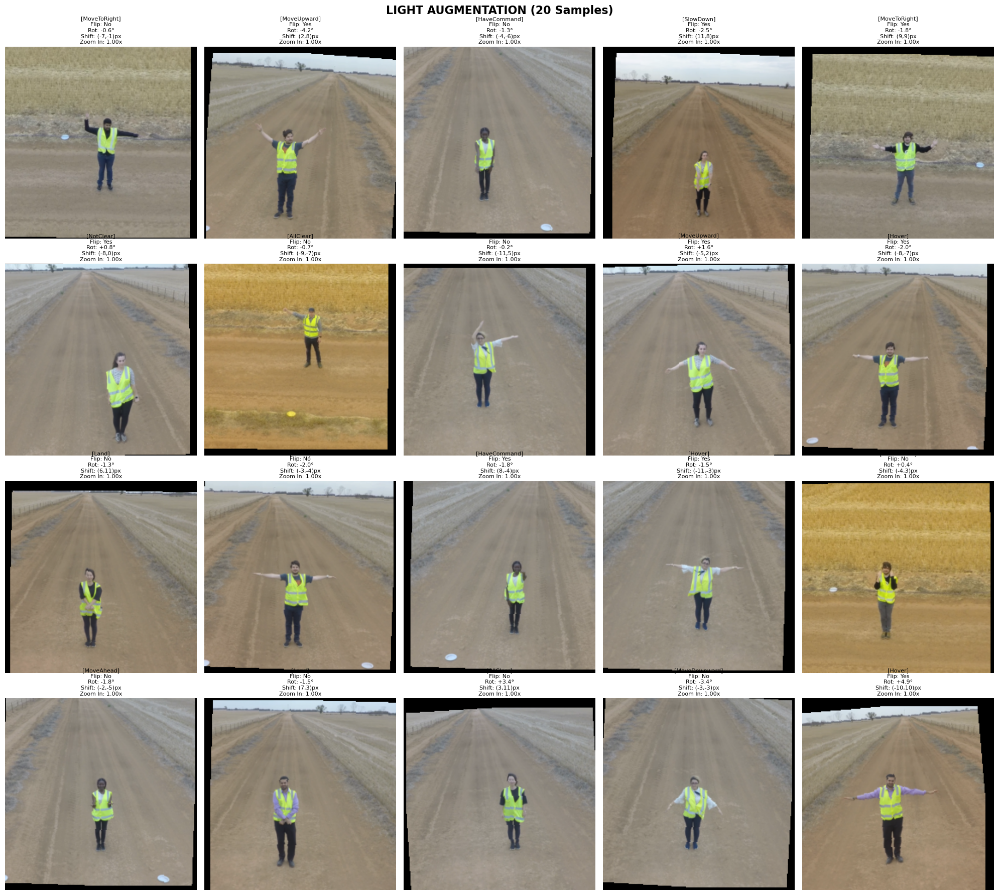

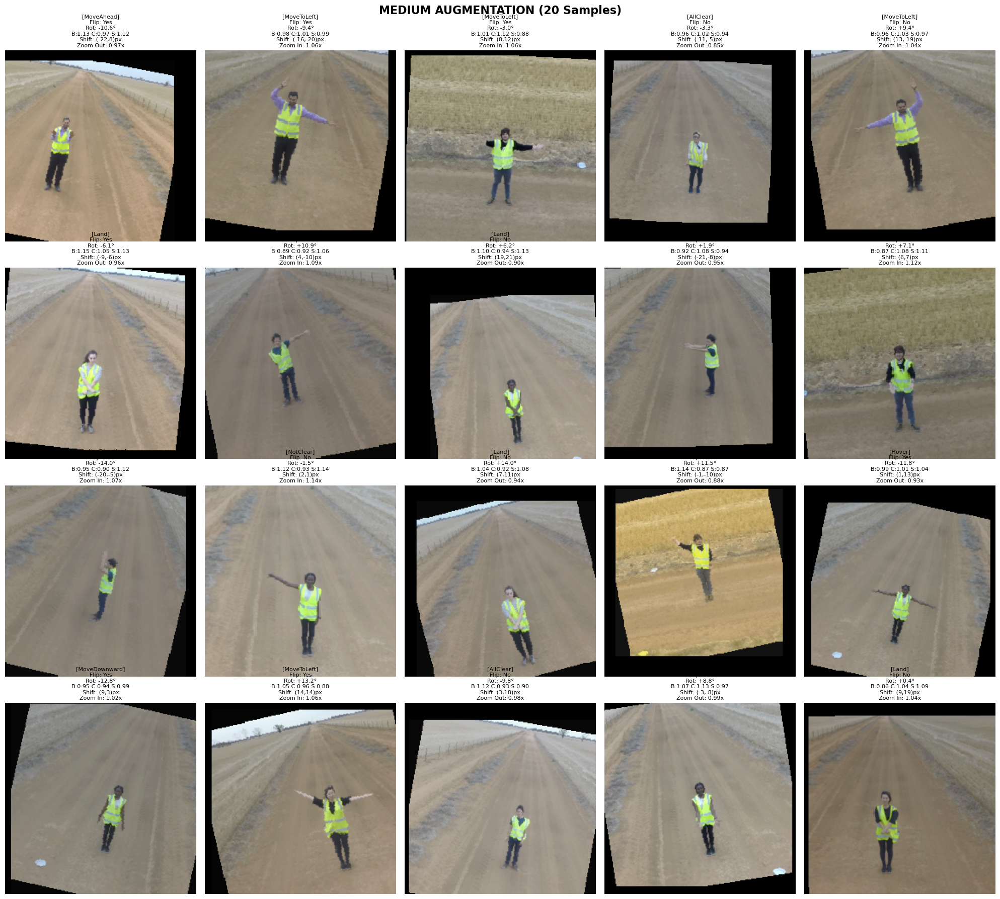

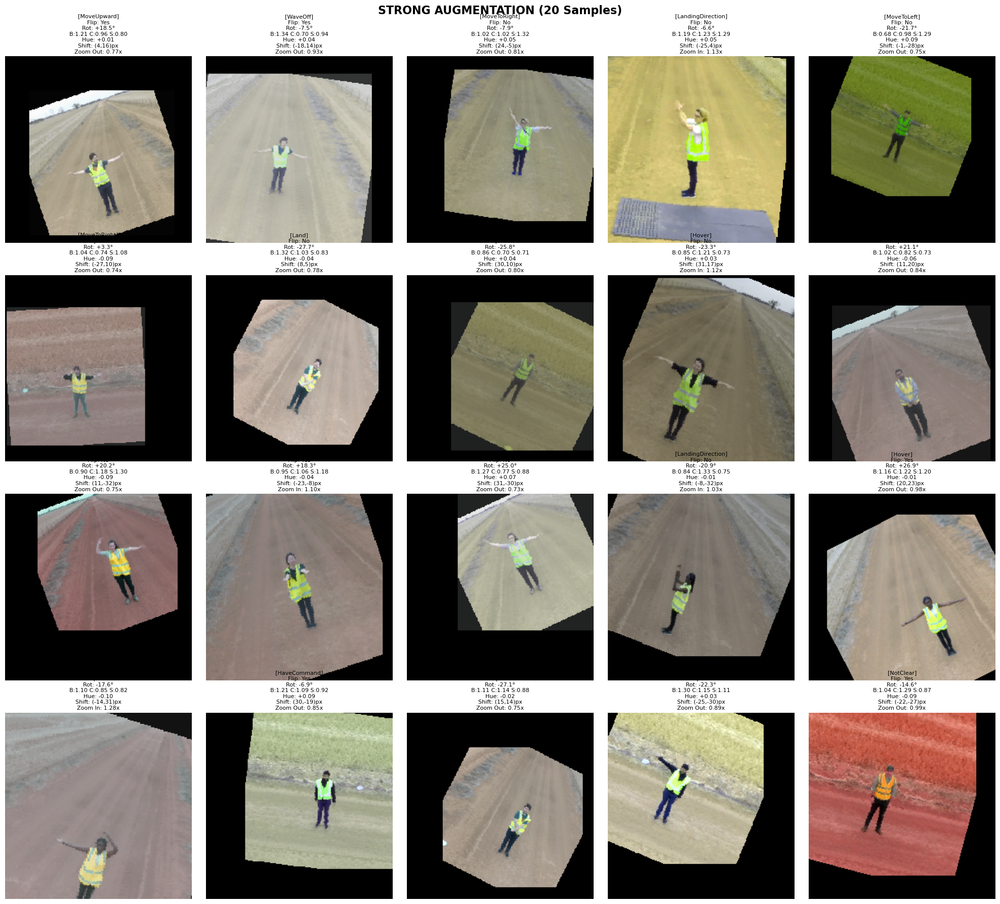

In [41]:
######################################################################################################################################
#5. Augmentation: visiualise to see 20 frames - single frame view
######################################################################################################################################

aug_levels = ['light', 'medium', 'strong']

for level in aug_levels:
    samples = df.sample(20).reset_index(drop=True)
    fig, axes = plt.subplots(4, 5, figsize=(20, 18))
    fig.suptitle(f"{level.upper()} AUGMENTATION (20 Samples)", fontsize=16, fontweight='bold', y=0.99)
    axes = axes.flatten()

    for i, (_, row) in enumerate(samples.iterrows()):
        img_path = row['path']
        gesture_label = row['gesture']
        pil_img = Image.open(img_path).convert("RGB")
        
        aug_tensor, applied_logs = apply_single_frame_aug(pil_img, gesture_label, level=level)
        aug_img = denormalize_tensor_to_np(aug_tensor)
        
        ax = axes[i]
        ax.imshow(aug_img)
        title_text = f"[{gesture_label}]\n" + "\n".join(applied_logs)
        ax.set_title(title_text, fontsize=8, pad=4)
        ax.axis('off')

    plt.tight_layout()
    plt.show()

In [65]:
######################################################################################################
#7.3 Baseline: create_resnet18 - aug_level='light'
######################################################################################################
# ============================================
# ITERATION LOG — Improvement Attempt x
# ============================================
# Signal:     ...
# Diagnosis:  ...
# Model: create_resnet18
# Method: Late Fusion, only Frozen
# Augmentation: Light,Medium & Strong (3 variants)
# Train method: Stratification, k-fold=5, No Actor Group
# Action:     EPOCHS=3
#
# ============================================
EPOCHS = 3

#clear to just compare the augmenations against each other
aug_results = {}

torch.manual_seed(0)
baseline_al = create_resnet18_lf(NUM_CLASSES).to(device)
freeze_backbone(baseline_al)

print('Step 1: Linear Probing with Light Augmentation')
count_params(baseline_al)

criterion = nn.CrossEntropyLoss(weight=class_weights)


results, cv_models, cv_loaders = stratifiedKFold_processing(
    model=baseline_al, 
    name='Sequence Probing Aug Light', 
    train_df=train_df,                  
    seq_transform=seq_transform,        
    aug_level='light',                  
    val_epoch=EPOCHS,
    criterion=criterion
)

#aug_results['v1: Linear Probing Aug light'] = results['CV_Avg']
aug_results['v1: Linear Probing Aug light'] = results['CV_Avg']

    
#configuration list for all trained folds
metrics_config = []

for fold_idx, (fold_model, (fold_train_loader, fold_val_loader)) in enumerate(zip(cv_models, cv_loaders)):
    metrics_config.append({
        'model': fold_model,
        'train_loader': fold_train_loader,
        'val_loader': fold_val_loader,
        'device': device,
        'name': f'Fold {fold_idx + 1}'
    })

print_evaluation_metrics(metrics_config)

Step 1: Linear Probing with Light Augmentation
  Trainable: 6,669 / 11,183,181 (0.06%)

Target fold 1/5
  [Sequence Probing Aug Light] Epoch 1/3 — Train Loss: 2.4878, Train Acc: 0.1722 | Val Loss: 2.2120, Val Acc: 0.2441
  [Sequence Probing Aug Light] Epoch 2/3 — Train Loss: 2.1324, Train Acc: 0.2894 | Val Loss: 2.0433, Val Acc: 0.3071
  [Sequence Probing Aug Light] Epoch 3/3 — Train Loss: 1.9314, Train Acc: 0.3701 | Val Loss: 1.9012, Val Acc: 0.3701

Target fold 2/5
  [Sequence Probing Aug Light] Epoch 1/3 — Train Loss: 2.4817, Train Acc: 0.1486 | Val Loss: 2.2228, Val Acc: 0.2835
  [Sequence Probing Aug Light] Epoch 2/3 — Train Loss: 2.1257, Train Acc: 0.2844 | Val Loss: 2.0111, Val Acc: 0.3543
  [Sequence Probing Aug Light] Epoch 3/3 — Train Loss: 1.8933, Train Acc: 0.3819 | Val Loss: 1.8570, Val Acc: 0.4094

Target fold 3/5
  [Sequence Probing Aug Light] Epoch 1/3 — Train Loss: 2.4280, Train Acc: 0.1772 | Val Loss: 2.2107, Val Acc: 0.2835
  [Sequence Probing Aug Light] Epoch 2/3 — 

In [66]:
######################################################################################################
#7.2 Baseline: create_resnet18 - aug_level='medium'
######################################################################################################
torch.manual_seed(0)
baseline_am = create_resnet18_lf(NUM_CLASSES).to(device)
freeze_backbone(baseline_am)

print('Step 1: Linear Probing with Medium Augmentation')
count_params(baseline_am)

criterion = nn.CrossEntropyLoss(weight=class_weights)


results, cv_models, cv_loaders = stratifiedKFold_processing(
    model=baseline_am, 
    name='Sequence Probing Med Light', 
    train_df=train_df,                  
    seq_transform=seq_transform,        
    aug_level='medium',                  
    val_epoch=EPOCHS,
    criterion=criterion
)

aug_results['v1: Linear Probing Aug medium'] = results['CV_Avg']

#configuration list for all trained folds
metrics_config = []

for fold_idx, (fold_model, (fold_train_loader, fold_val_loader)) in enumerate(zip(cv_models, cv_loaders)):
    metrics_config.append({
        'model': fold_model,
        'train_loader': fold_train_loader,
        'val_loader': fold_val_loader,
        'device': device,
        'name': f'Fold {fold_idx + 1}'
    })

        
print_evaluation_metrics(metrics_config)

Step 1: Linear Probing with Medium Augmentation
  Trainable: 6,669 / 11,183,181 (0.06%)

Target fold 1/5
  [Sequence Probing Med Light] Epoch 1/3 — Train Loss: 2.5242, Train Acc: 0.1280 | Val Loss: 2.2452, Val Acc: 0.2520
  [Sequence Probing Med Light] Epoch 2/3 — Train Loss: 2.2096, Train Acc: 0.2520 | Val Loss: 2.0851, Val Acc: 0.2992
  [Sequence Probing Med Light] Epoch 3/3 — Train Loss: 2.0273, Train Acc: 0.3061 | Val Loss: 1.9404, Val Acc: 0.3780

Target fold 2/5
  [Sequence Probing Med Light] Epoch 1/3 — Train Loss: 2.5316, Train Acc: 0.1240 | Val Loss: 2.2597, Val Acc: 0.2913
  [Sequence Probing Med Light] Epoch 2/3 — Train Loss: 2.2036, Train Acc: 0.2549 | Val Loss: 2.0594, Val Acc: 0.2992
  [Sequence Probing Med Light] Epoch 3/3 — Train Loss: 2.0143, Train Acc: 0.3268 | Val Loss: 1.9365, Val Acc: 0.3701

Target fold 3/5
  [Sequence Probing Med Light] Epoch 1/3 — Train Loss: 2.4633, Train Acc: 0.1585 | Val Loss: 2.2664, Val Acc: 0.2677
  [Sequence Probing Med Light] Epoch 2/3 —

Step 1: Linear Probing with Strong Augmentation
  Trainable: 6,669 / 11,183,181 (0.06%)

Target fold 1/5
  [Sequence Probing Aug Strong] Epoch 1/3 — Train Loss: 2.5714, Train Acc: 0.1309 | Val Loss: 2.2766, Val Acc: 0.2362
  [Sequence Probing Aug Strong] Epoch 2/3 — Train Loss: 2.3030, Train Acc: 0.2146 | Val Loss: 2.1401, Val Acc: 0.2520
  [Sequence Probing Aug Strong] Epoch 3/3 — Train Loss: 2.1528, Train Acc: 0.2874 | Val Loss: 1.9993, Val Acc: 0.3465

Target fold 2/5
  [Sequence Probing Aug Strong] Epoch 1/3 — Train Loss: 2.5734, Train Acc: 0.1083 | Val Loss: 2.3007, Val Acc: 0.2520
  [Sequence Probing Aug Strong] Epoch 2/3 — Train Loss: 2.2973, Train Acc: 0.2185 | Val Loss: 2.1122, Val Acc: 0.2756
  [Sequence Probing Aug Strong] Epoch 3/3 — Train Loss: 2.1103, Train Acc: 0.2913 | Val Loss: 1.9881, Val Acc: 0.3780

Target fold 3/5
  [Sequence Probing Aug Strong] Epoch 1/3 — Train Loss: 2.5162, Train Acc: 0.1358 | Val Loss: 2.2864, Val Acc: 0.2677
  [Sequence Probing Aug Strong] Epo

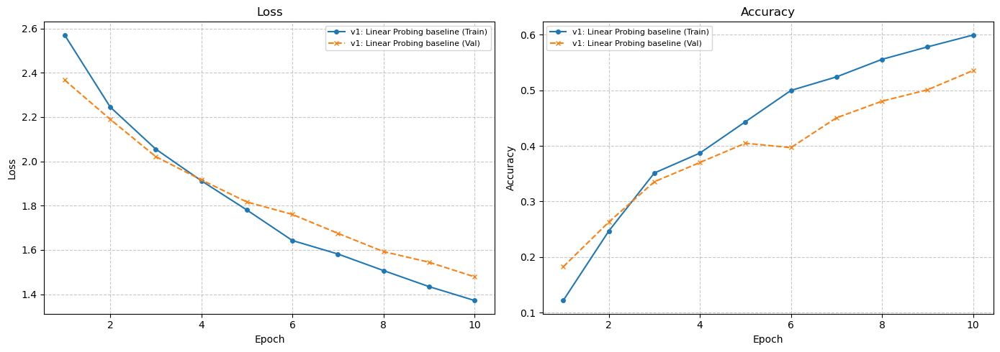

In [67]:
######################################################################################################
#7.3 Baseline: create_resnet18 - aug_level='strong'
######################################################################################################

torch.manual_seed(0)
baseline_as = create_resnet18_lf(NUM_CLASSES).to(device)
freeze_backbone(baseline_as)

print('Step 1: Linear Probing with Strong Augmentation')
count_params(baseline_as)

criterion = nn.CrossEntropyLoss(weight=class_weights)

results, cv_models, cv_loaders = stratifiedKFold_processing(
    model=baseline_as, 
    name='Sequence Probing Aug Strong', 
    train_df=train_df,                  
    seq_transform=seq_transform,        
    aug_level='strong',                  
    val_epoch=EPOCHS,
    criterion=criterion
)

aug_results['v1: Linear Probing Aug strong'] = results['CV_Avg']

#configuration list for all trained folds
metrics_config = []

for fold_idx, (fold_model, (fold_train_loader, fold_val_loader)) in enumerate(zip(cv_models, cv_loaders)):
    metrics_config.append({
        'model': fold_model,
        'train_loader': fold_train_loader,
        'val_loader': fold_val_loader,
        'device': device,
        'name': f'Fold {fold_idx + 1}'
    })
    
print_evaluation_metrics(metrics_config)


plot_experiments(aug_results)

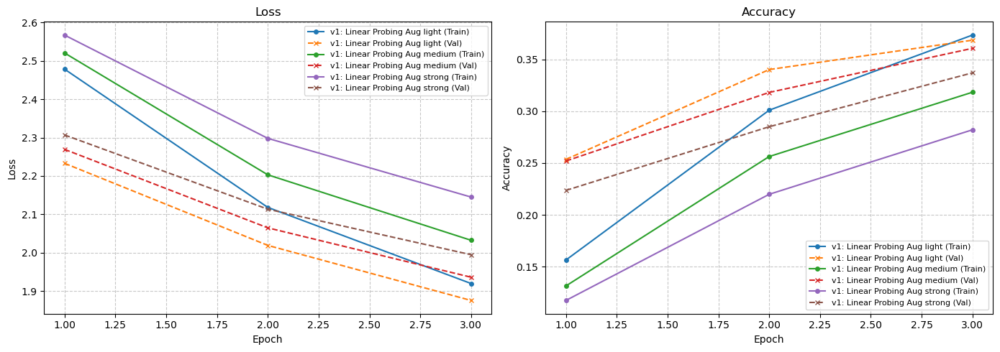

In [68]:
plot_experiments(aug_results)

+ From the results of the 3 different Augementations the Light variant training has the lowest Loss under 1.3 and the validation curve for Light is the lowest compared to the other validation curves and tightly close to the training curve which shows a good fit

+ For the Accuracy the Light variant training curve is the highest of all the training curves reaching just under 0.6. The Validation Accruacy curve is the highest of the other validation curves,
and starts off ahead of the training curve then dips under around 5.6 epoch before dropping and then liftinging and bouncing under the training loss curve at epoch 9 suggesting it is learning from the training and possibly some slight overfitting.

+ All the loss curves in general are still sloping in a downward trend suggesting that the training may have ended prematurely and that a higher number of epochs may be needed to see where it might reach convergence.

+ As this expiriment is just to identify the best Augmentation Variant it is clear that the Light Variant is the best choice

Step 1: Linear Probing with Light Augmentation
  Trainable: 6,669 / 11,183,181 (0.06%)

Target fold 1/5
  [Sequence Probing Aug Light] Epoch 1/10 — Train Loss: 2.4878, Train Acc: 0.1722 | Val Loss: 2.2120, Val Acc: 0.2441
  [Sequence Probing Aug Light] Epoch 2/10 — Train Loss: 2.1324, Train Acc: 0.2894 | Val Loss: 2.0433, Val Acc: 0.3071
  [Sequence Probing Aug Light] Epoch 4/10 — Train Loss: 1.7694, Train Acc: 0.4262 | Val Loss: 1.7619, Val Acc: 0.4488
  [Sequence Probing Aug Light] Epoch 6/10 — Train Loss: 1.5874, Train Acc: 0.4823 | Val Loss: 1.5089, Val Acc: 0.4646
  [Sequence Probing Aug Light] Epoch 8/10 — Train Loss: 1.4251, Train Acc: 0.5315 | Val Loss: 1.4905, Val Acc: 0.4567
  [Sequence Probing Aug Light] Epoch 10/10 — Train Loss: 1.3165, Train Acc: 0.5807 | Val Loss: 1.2856, Val Acc: 0.5433

Target fold 2/5
  [Sequence Probing Aug Light] Epoch 1/10 — Train Loss: 2.4984, Train Acc: 0.1368 | Val Loss: 2.2235, Val Acc: 0.2441
  [Sequence Probing Aug Light] Epoch 2/10 — Train Lo

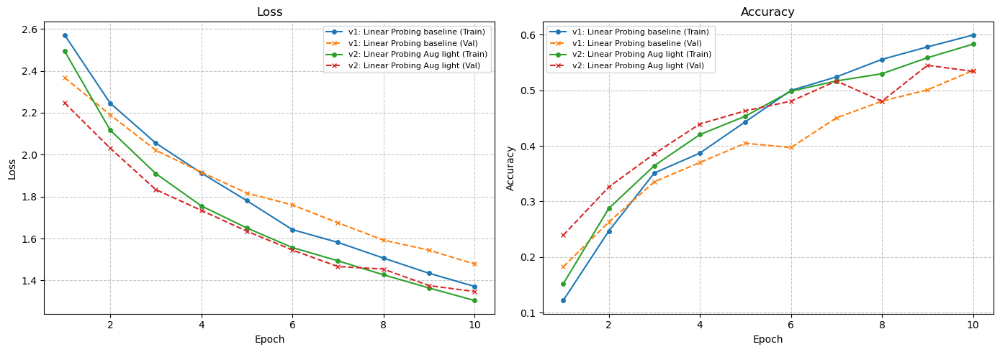

In [71]:
######################################################################################################
# apply best augmentation with kfold Stratification no actor group, 

# create_resnet18_lf
# stratifiedKFold_processing

######################################################################################################

# ==========================================================================
# ITERATION LOG — Improvement Attempt 2 .Baseline v2 Linear Probing Aug light
# ==========================================================================
# Signal:     ...
# Diagnosis:  ...
# Model: create_resnet18
# Method: Late Fusion, only Frozen
# Augmentation: Light
# Train method: Stratification, k-fold=5, No Actor Group
# Action:     EPOCHS=10
#
# ============================================

#clear to just compare the augmenations against each other

EPOCHS=10
torch.manual_seed(0)
baseline_al = create_resnet18_lf(NUM_CLASSES).to(device)
freeze_backbone(baseline_al)

print('Step 1: Linear Probing with Light Augmentation')
count_params(baseline_al)


criterion = nn.CrossEntropyLoss(weight=class_weights)

results = {}
results, cv_models, cv_loaders = stratifiedKFold_processing(
    model=baseline_al, 
    name='Sequence Probing Aug Light', 
    train_df=train_df,                  
    seq_transform=seq_transform,        
    aug_level='light',                  
    val_epoch=EPOCHS,             
    criterion=criterion
)


all_results['v2: Linear Probing Aug light'] = results['CV_Avg']

    
#configuration list for all trained folds
metrics_config = []

for fold_idx, (fold_model, (fold_train_loader, fold_val_loader)) in enumerate(zip(cv_models, cv_loaders)):
    metrics_config.append({
        'model': fold_model,
        'train_loader': fold_train_loader,
        'val_loader': fold_val_loader,
        'device': device,
        'name': f'Fold {fold_idx + 1}'
    })

print_evaluation_metrics(metrics_config)

plot_experiments(all_results)


Step 1: Linear Probing with Medium Augmentation
  Trainable: 6,669 / 11,183,181 (0.06%)

Target fold 1/5
  > Phase 1: Probing (5 epochs)
  [v1b: Fine-Tuning_LR_1e-5_Fold_1_P1] Epoch 1/5 — Train Loss: 2.4878, Train Acc: 0.1722 | Val Loss: 2.2120, Val Acc: 0.2441
  [v1b: Fine-Tuning_LR_1e-5_Fold_1_P1] Epoch 2/5 — Train Loss: 2.1324, Train Acc: 0.2894 | Val Loss: 2.0433, Val Acc: 0.3071
  [v1b: Fine-Tuning_LR_1e-5_Fold_1_P1] Epoch 3/5 — Train Loss: 1.9314, Train Acc: 0.3701 | Val Loss: 1.9012, Val Acc: 0.3701
  [v1b: Fine-Tuning_LR_1e-5_Fold_1_P1] Epoch 4/5 — Train Loss: 1.7694, Train Acc: 0.4262 | Val Loss: 1.7619, Val Acc: 0.4488
  [v1b: Fine-Tuning_LR_1e-5_Fold_1_P1] Epoch 5/5 — Train Loss: 1.6941, Train Acc: 0.4449 | Val Loss: 1.6063, Val Acc: 0.4882
  > Phase 2: Fine-Tuning (5 epochs)
  [v1b: Fine-Tuning_LR_1e-5_Fold_1_P2] Epoch 1/5 — Train Loss: 1.3701, Train Acc: 0.5827 | Val Loss: 1.1711, Val Acc: 0.5984
  [v1b: Fine-Tuning_LR_1e-5_Fold_1_P2] Epoch 2/5 — Train Loss: 1.0705, Train 

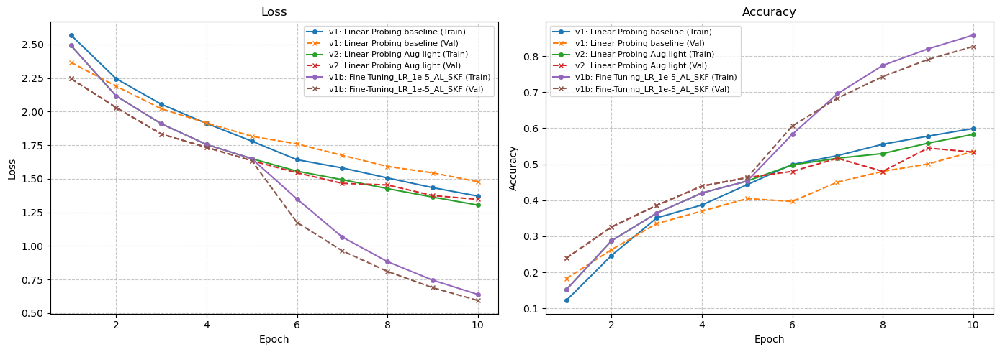

In [78]:
######################################################################################################
#7.6 apply best augmentation with kfold Stratification 

#transfer learning - standard - aug_level='light' with kfold Stratification no actor group

# create_resnet18_lf
# stratifiedKFold_processing_twostage
######################################################################################################
# ===========================================================
# ITERATION LOG — Improvement Attempt 3
# ===========================================================
# Signal:     ...
# Diagnosis:  ...
# Model: create_resnet18
# Method: Late Fusion, Frozen
# Augmentation: Light, Actor Group
# Action:     EPOCHS = 5.frozon backbone, 5.unfrozon backbone
#
# ===========================================================


torch.manual_seed(0)
#baseline Aug light
baseline_al = create_resnet18_lf(NUM_CLASSES).to(device)
freeze_backbone(baseline_al)

print('Step 1: Fine tuning, late fusion, light Augmentation')
count_params(baseline_al)

#baseline medium
#no drop test this iteration

criterion = nn.CrossEntropyLoss(weight=class_weights)

results, cv_models, cv_loaders = stratifiedKFold_processing_twostage(
    model=baseline_al, 
    name='v1b: Fine-Tuning_LR_1e-5', 
    train_df=train_df,                  
    seq_transform=seq_transform,        
    aug_level='light',                  
    p1_epochs=5,           # previous best aug exp had 10 epochs on the frozen backbone 
    p2_epochs=5,          # Number of fine-tuning epochs after unfreezing the backbone
    ft_lr=1e-5,            # after the backbone is unfrozen The fine-tuning learning rate that is very low with 1e-5
    wd=0,               # Start off with 0
    criterion=criterion
)

all_results['v1b: Fine-Tuning_LR_1e-5_AL_SKF'] = results['CV_Avg']

#configuration list for all trained folds
metrics_config = []

for fold_idx, (fold_model, (fold_train_loader, fold_val_loader)) in enumerate(zip(cv_models, cv_loaders)):
    metrics_config.append({
        'model': fold_model,
        'train_loader': fold_train_loader,
        'val_loader': fold_val_loader,
        'device': device,
        'name': f'Fold {fold_idx + 1}'
    })

        
print_evaluation_metrics(metrics_config)
plot_experiments(all_results)


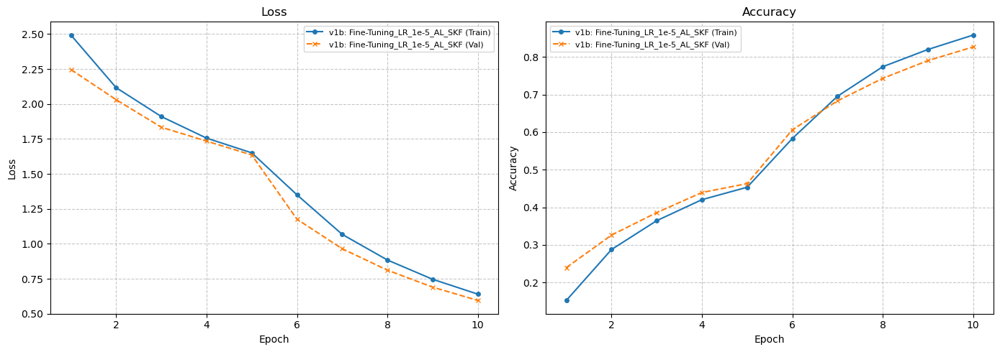

In [81]:
temp = {
    'v1b: Fine-Tuning_LR_1e-5_AL_SKF':
        all_results['v1b: Fine-Tuning_LR_1e-5_AL_SKF']
}

plot_experiments(temp)

+ From the Loss it can be seen that the train loss curve and the validation are smooth and tracking each other closly, so it does not appeaar that there is any underfitting or over fitting.
+ Also the Accuracy is rising close to each other which suggests that the accuracy is of the validation and training curve is working to help the validation
+ Although it appears based on the curve which has not reached a hortizontal state in both cases it maybe that 10 epochs may be too early.
+ As the baseline and the iterations up until this point are using late fusing where the five frames of the set are passed into the cnn and averaged on the outputs, this requires five inference
  passes which is computationally expensive compared to a single pass which can be done using pre fusion were the images are stacked and pushed through as a stacked input. If the pre fusion can  achieve a better result, or the same result it would be worth switching to the pre fusion and using that as this model is hardware constrained. 

Step 1: Fine tuning, early fusion light Augmentation
  Trainable: 6,669 / 11,220,813 (0.06%)

Target fold 1/5
  > Phase 1: Probing (5 epochs)
  [v1b: Fine-Tuning_EF_LR_1e-5_Fold_1_P1] Epoch 1/5 — Train Loss: 2.3675, Train Acc: 0.2106 | Val Loss: 2.1286, Val Acc: 0.2835
  [v1b: Fine-Tuning_EF_LR_1e-5_Fold_1_P1] Epoch 2/5 — Train Loss: 1.9719, Train Acc: 0.3612 | Val Loss: 1.9165, Val Acc: 0.4016
  [v1b: Fine-Tuning_EF_LR_1e-5_Fold_1_P1] Epoch 3/5 — Train Loss: 1.7531, Train Acc: 0.4419 | Val Loss: 1.7154, Val Acc: 0.4488
  [v1b: Fine-Tuning_EF_LR_1e-5_Fold_1_P1] Epoch 4/5 — Train Loss: 1.6133, Train Acc: 0.4843 | Val Loss: 1.6313, Val Acc: 0.4488
  [v1b: Fine-Tuning_EF_LR_1e-5_Fold_1_P1] Epoch 5/5 — Train Loss: 1.5038, Train Acc: 0.5079 | Val Loss: 1.5587, Val Acc: 0.4646
  > Phase 2: Fine-Tuning (5 epochs)
  [v1b: Fine-Tuning_EF_LR_1e-5_Fold_1_P2] Epoch 1/5 — Train Loss: 1.2872, Train Acc: 0.5994 | Val Loss: 1.2486, Val Acc: 0.5669
  [v1b: Fine-Tuning_EF_LR_1e-5_Fold_1_P2] Epoch 2/5 — 

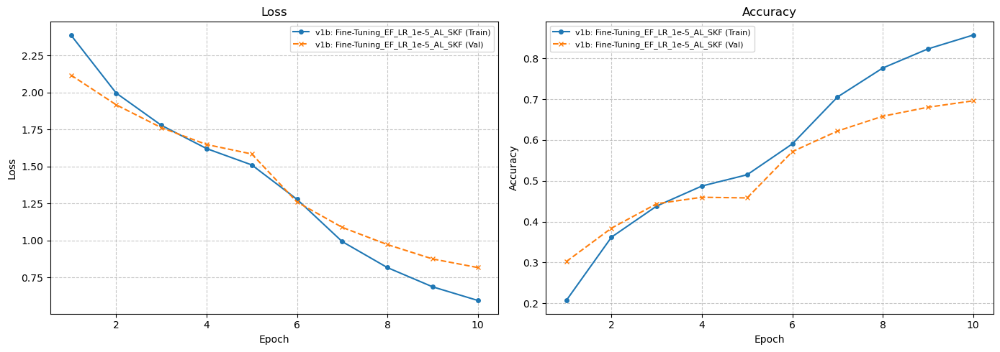

In [82]:
######################################################################################################
#7.6 apply best augmentation with kfold Stratification 

#transfer learning - standard - aug_level='light' with kfold Stratification no actor group

# create_resnet18_lf
# stratifiedKFold_processing_twostage
######################################################################################################
# ===========================================================
# ITERATION LOG — Improvement Attempt 4
# ===========================================================
# Signal:     ...
# Diagnosis:  ...
# Model: create_resnet18
# Method: Early Fusion, Frozen
# Augmentation: Light
# Action:     EPOCHS = 5.frozon backbone, 5.unfrozon backbone
#
# ===========================================================


torch.manual_seed(0)
#baseline Aug light
baseline_al = create_resnet18_ef(NUM_CLASSES).to(device)
freeze_backbone(baseline_al)

print('Step 1: Fine tuning, early fusion light Augmentation')
count_params(baseline_al)

#baseline medium
#no drop test this iteration

criterion = nn.CrossEntropyLoss(weight=class_weights)

results, cv_models, cv_loaders = stratifiedKFold_processing_twostage(
    model=baseline_al, 
    name='v1b: Fine-Tuning_EF_LR_1e-5', 
    train_df=train_df,                  
    seq_transform=seq_transform,        
    aug_level='light',                  
    p1_epochs=5,           # previous best aug exp had 10 epochs on the frozen backbone 
    p2_epochs=5,          # Number of fine-tuning epochs after unfreezing the backbone
    ft_lr=1e-5,            # after the backbone is unfrozen The fine-tuning learning rate that is very low with 1e-5
    wd=0,               # Start off with 0
    criterion=criterion
)
all_results['v1b: Fine-Tuning_EF_LR_1e-5_AL_SKF'] = results['CV_Avg']

#configuration list for all trained folds
metrics_config = []

for fold_idx, (fold_model, (fold_train_loader, fold_val_loader)) in enumerate(zip(cv_models, cv_loaders)):
    metrics_config.append({
        'model': fold_model,
        'train_loader': fold_train_loader,
        'val_loader': fold_val_loader,
        'device': device,
        'name': f'Fold {fold_idx + 1}'
    })

        
print_evaluation_metrics(metrics_config)
plot_experiments(all_results)


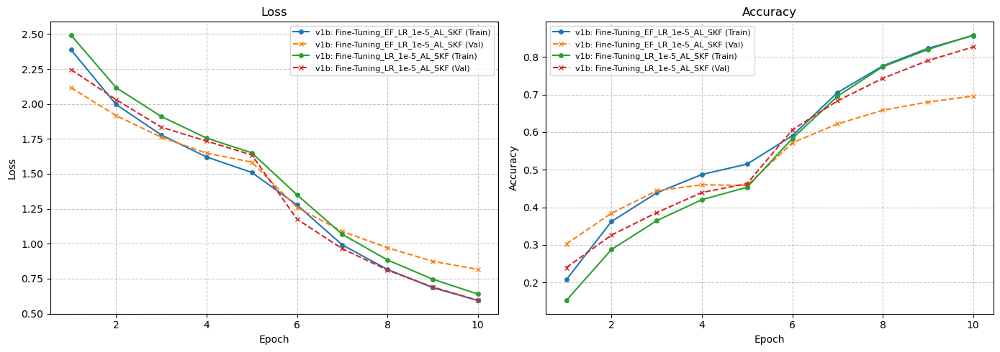

In [84]:
temp_results['v1b: Fine-Tuning_EF_LR_1e-5_AL_SKF'] = all_results['v1b: Fine-Tuning_EF_LR_1e-5_AL_SKF']
temp_results['v1b: Fine-Tuning_LR_1e-5_AL_SKF'] = all_results['v1b: Fine-Tuning_LR_1e-5_AL_SKF']
plot_experiments(temp_results)

+ The Early Fusion training curve "v1b: Fine-Tuning_EF_LR_1e-5_AL_SKF (Train)" archieves a lower loss earlier by Epoch 10 compared to the Late Fusion training curve "v1b: Fine-Tuning_LR_1e-5_AL_SKF"(Train), but the Early fusion validation begins to deviate away from the Train loss curve just before Epoch 6, where as the Late Fusion validation archieves a better result than the loss Train curve. This suggests that the model is doing better on the validation set. With the accuracy curves the Late Fusion validation is also more Accurate then the Early Fusion approach.
+ This has shown that the late fusion approach yields better results earlier in training.

Phase 1: Tuning Dropout

Testing Dropout = 0.02

Target fold 1/5
  > Phase 1: Probing (5 epochs)
  [v5_Drop_0.02_Fold_1_P1] Epoch 1/5 — Train Loss: 2.4885, Train Acc: 0.1634 | Val Loss: 2.2132, Val Acc: 0.2441
  [v5_Drop_0.02_Fold_1_P1] Epoch 2/5 — Train Loss: 2.1349, Train Acc: 0.2854 | Val Loss: 2.0441, Val Acc: 0.3150
  [v5_Drop_0.02_Fold_1_P1] Epoch 3/5 — Train Loss: 1.9312, Train Acc: 0.3711 | Val Loss: 1.9031, Val Acc: 0.3701
  [v5_Drop_0.02_Fold_1_P1] Epoch 4/5 — Train Loss: 1.7717, Train Acc: 0.4232 | Val Loss: 1.7638, Val Acc: 0.4409
  [v5_Drop_0.02_Fold_1_P1] Epoch 5/5 — Train Loss: 1.6976, Train Acc: 0.4439 | Val Loss: 1.6084, Val Acc: 0.4803
  > Phase 2: Fine-Tuning (5 epochs)
  [v5_Drop_0.02_Fold_1_P2] Epoch 1/5 — Train Loss: 1.3721, Train Acc: 0.5846 | Val Loss: 1.1732, Val Acc: 0.5906
  [v5_Drop_0.02_Fold_1_P2] Epoch 2/5 — Train Loss: 1.0710, Train Acc: 0.6929 | Val Loss: 0.9465, Val Acc: 0.6772
  [v5_Drop_0.02_Fold_1_P2] Epoch 3/5 — Train Loss: 0.8926, Train Acc: 0.7608

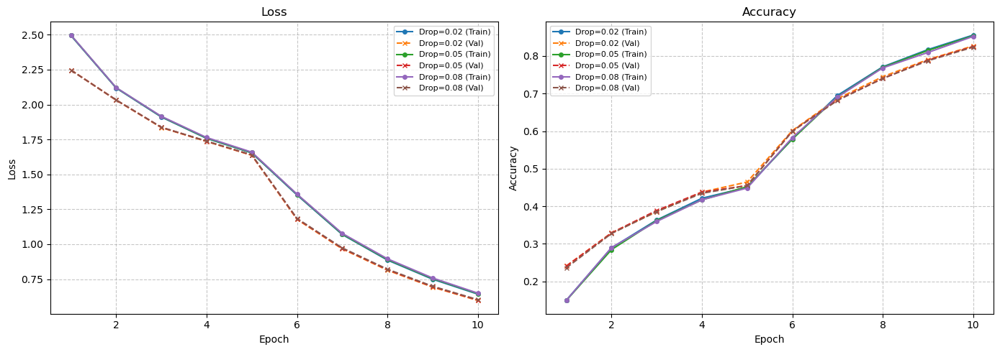

In [88]:
# ===========================================================
# ITERATION LOG — Improvement Attempt 5
# ===========================================================
# Signal:     ...
# Diagnosis:  ...
# Model: create_resnet18
# Method: Late Fusion 
# Augmentation: Light
# Action:     EPOCHS = 5.frozon backbone, 5.unfrozon backbone
# Fine-Tune: Drop out:[0.0, 0.05, 0.1]
# ===========================================================
dropout_rates = [0.02, 0.05, 0.08]

dropout_results = {}
all_cv_models = {}
all_cv_loaders = {}

criterion = nn.CrossEntropyLoss(weight=class_weights)

print("Phase 1: Tuning Dropout")
for drop in dropout_rates:
    exp_name = f"v5_Drop_{drop}"
    print(f"\nTesting Dropout = {drop}")
    
    torch.manual_seed(0)
    
    #pass the active "drop" param to the model during creation
    baseline_al = create_resnet18_lf(NUM_CLASSES, dropout_rate=drop).to(device)
    freeze_backbone(baseline_al)

    #run K-Fold across 2-stage training pipeline
    results, cv_models, cv_loaders = stratifiedKFold_processing_twostage(
        model=baseline_al, 
        name=exp_name, 
        train_df=train_df,                  
        seq_transform=seq_transform,        
        aug_level='light',                  
        p1_epochs=5,           
        p2_epochs=5,          
        ft_lr=1e-5,            
        wd=0,               
        criterion=criterion
    )
    
    # Store aggregated metrics and fold models per dropout level
    dropout_results[f"Drop={drop}"] = results['CV_Avg']
    all_cv_models[f"Drop={drop}"] = cv_models
    all_cv_loaders[f"Drop={drop}"] = cv_loaders

# Select winning dropout based on highest CV validation accuracy
best_drop_key = max(dropout_results, key=lambda k: max(dropout_results[k]['val_acc']))
best_dropout = float(best_drop_key.split('=')[1])
print(f"\n✅ Best Dropout selected: {best_dropout} (Key: {best_drop_key})\n")

# Retrieve the specific models and dataloaders that won
best_cv_models = all_cv_models[best_drop_key]
best_cv_loaders = all_cv_loaders[best_drop_key]

# Build evaluation list for the winning configuration
metrics_config = []
for fold_idx, (fold_model, (fold_train_loader, fold_val_loader)) in enumerate(zip(best_cv_models, best_cv_loaders)):
    metrics_config.append({
        'model': fold_model,
        'train_loader': fold_train_loader,
        'val_loader': fold_val_loader,
        'device': device,
        'name': f'Best Model ({best_drop_key}) Fold {fold_idx + 1}'
    })

# Output final evaluation metrics and plots
print_evaluation_metrics(metrics_config)
plot_experiments(dropout_results)


Phase 1: Tuning Weight Decay

Testing Weight Decay = 0.0

Target fold 1/5
  > Phase 1: Probing (5 epochs)
  [v6_WD_0.0_Fold_1_P1] Epoch 1/5 — Train Loss: 2.4878, Train Acc: 0.1722 | Val Loss: 2.2120, Val Acc: 0.2441
  [v6_WD_0.0_Fold_1_P1] Epoch 2/5 — Train Loss: 2.1324, Train Acc: 0.2894 | Val Loss: 2.0433, Val Acc: 0.3071
  [v6_WD_0.0_Fold_1_P1] Epoch 3/5 — Train Loss: 1.9314, Train Acc: 0.3701 | Val Loss: 1.9012, Val Acc: 0.3701
  [v6_WD_0.0_Fold_1_P1] Epoch 4/5 — Train Loss: 1.7694, Train Acc: 0.4262 | Val Loss: 1.7619, Val Acc: 0.4488
  [v6_WD_0.0_Fold_1_P1] Epoch 5/5 — Train Loss: 1.6941, Train Acc: 0.4449 | Val Loss: 1.6063, Val Acc: 0.4882
  > Phase 2: Fine-Tuning (5 epochs)
  [v6_WD_0.0_Fold_1_P2] Epoch 1/5 — Train Loss: 1.3701, Train Acc: 0.5827 | Val Loss: 1.1711, Val Acc: 0.5984
  [v6_WD_0.0_Fold_1_P2] Epoch 2/5 — Train Loss: 1.0705, Train Acc: 0.6890 | Val Loss: 0.9444, Val Acc: 0.6772
  [v6_WD_0.0_Fold_1_P2] Epoch 3/5 — Train Loss: 0.8910, Train Acc: 0.7717 | Val Loss: 0.

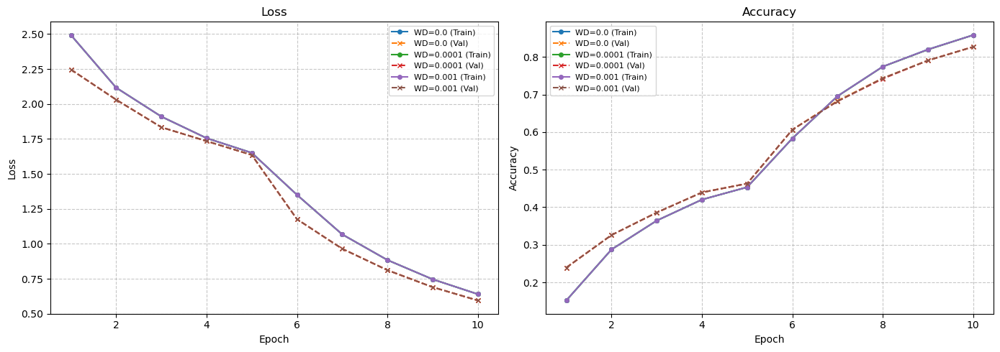

In [ ]:
# ===========================================================
# ITERATION LOG — Improvement Attempt 6
# ===========================================================
# Signal:     ...
# Diagnosis:  ...
# Model: create_resnet18
# Method: Late Fusion 
# Augmentation: Light
# Action:     EPOCHS = 5.frozon backbone, 5.unfrozon backbone
# Fine-Tune: Weight Decay:[0.0, 1e-4, 1e-3]
# ===========================================================
best_dropout = 0.00
weight_decays = [0.0, 1e-4, 1e-3]

wd_results = {}
all_cv_models_wd = {}
all_cv_loaders_wd = {}

criterion = nn.CrossEntropyLoss(weight=class_weights)

print("Phase 1: Tuning Weight Decay")
for w_d in weight_decays:
    exp_name = f"v6_WD_{w_d}"
    print(f"\nTesting Weight Decay = {w_d}")
    
    torch.manual_seed(0)
    
    baseline_al = create_resnet18_lf(NUM_CLASSES, dropout_rate=best_dropout).to(device)
    freeze_backbone(baseline_al)

    #run K-Fold across 2-stage training pipeline
    results, cv_models, cv_loaders = stratifiedKFold_processing_twostage(
        model=baseline_al, 
        name=exp_name, 
        train_df=train_df,                  
        seq_transform=seq_transform,        
        aug_level='light',                  
        p1_epochs=5,           
        p2_epochs=5,          
        ft_lr=1e-5,            
        wd=w_d,               
        criterion=criterion
    )
    
    # Store aggregated metrics and fold models per dropout level
    wd_results[f"WD={w_d}"] = results['CV_Avg']
    all_cv_models_wd[f"WD={w_d}"] = cv_models
    all_cv_loaders_wd[f"WD={w_d}"] = cv_loaders

# Select winning dropout based on highest CV validation accuracy
best_wd_key = max(wd_results, key=lambda k: max(wd_results[k]['val_acc']))
best_wd = float(best_wd_key.split('=')[1])
print(f"\n✅ Best Weight Decay selected: {best_wd} (Key: {best_wd_key})\n")

# Retrieve the specific models and dataloaders that won
best_cv_models_wd = all_cv_models_wd[best_wd_key]
best_cv_loaders_wd = all_cv_loaders_wd[best_wd_key]

# Build evaluation list for the winning configuration
metrics_config = []
for fold_idx, (fold_model, (fold_train_loader, fold_val_loader)) in enumerate(zip(best_cv_models_wd, best_cv_loaders_wd)):
    metrics_config.append({
        'model': fold_model,
        'train_loader': fold_train_loader,
        'val_loader': fold_val_loader,
        'device': device,
        'name': f'Best Model ({best_wd_key}) Fold {fold_idx + 1}'
    })

# Output final evaluation metrics and plots
print_evaluation_metrics(metrics_config)
plot_experiments(wd_results)


Phase 3: Tuning Peak Fine-Tuning LR (Drop=0, WD=0)

Testing Peak LR = 1e-05 (Cosine Decay)

Target fold 1/5
  > Phase 1: Probing (5 epochs)
  [v7_LR_1e-05_Cosine_Fold_1_P1] Epoch 1/5 — Train Loss: 2.4878, Train Acc: 0.1722 | Val Loss: 2.2120, Val Acc: 0.2441
  [v7_LR_1e-05_Cosine_Fold_1_P1] Epoch 2/5 — Train Loss: 2.1324, Train Acc: 0.2894 | Val Loss: 2.0433, Val Acc: 0.3071
  [v7_LR_1e-05_Cosine_Fold_1_P1] Epoch 3/5 — Train Loss: 1.9314, Train Acc: 0.3701 | Val Loss: 1.9012, Val Acc: 0.3701
  [v7_LR_1e-05_Cosine_Fold_1_P1] Epoch 4/5 — Train Loss: 1.7694, Train Acc: 0.4262 | Val Loss: 1.7619, Val Acc: 0.4488
  [v7_LR_1e-05_Cosine_Fold_1_P1] Epoch 5/5 — Train Loss: 1.6941, Train Acc: 0.4449 | Val Loss: 1.6063, Val Acc: 0.4882
  > Phase 2: Fine-Tuning (5 epochs)
  [v7_LR_1e-05_Cosine_Fold_1_P2] Epoch 1/5 — Train Loss: 1.3701, Train Acc: 0.5827 | Val Loss: 1.1711, Val Acc: 0.5984
  [v7_LR_1e-05_Cosine_Fold_1_P2] Epoch 2/5 — Train Loss: 1.0705, Train Acc: 0.6890 | Val Loss: 0.9444, Val Acc

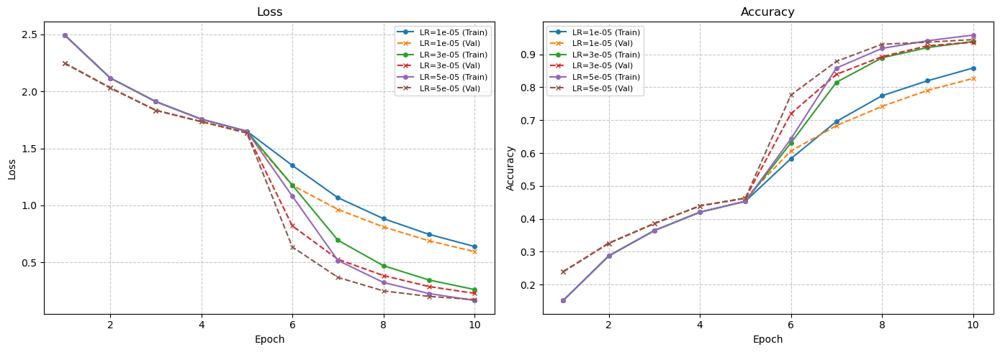

In [22]:
# ===========================================================
# ITERATION LOG — Improvement Attempt 7
# ===========================================================
# Signal:     ...
# Diagnosis:  ...
# Model: create_resnet18
# Method: Late Fusion 
# Augmentation: Light
# Action:     EPOCHS = 5.frozon backbone, 5.unfrozon backbone, best drop out, best weight decay
# Fine-Tune: learning rate using cosine decay:[1e-5, 3e-5, 5e-5]
# ===========================================================



best_dropout = 0
best_wd = 0

learning_rates = [1e-5, 3e-5, 5e-5]

lr_results = {}
all_cv_models_lr = {}
all_cv_loaders_lr = {}


criterion = nn.CrossEntropyLoss(weight=class_weights)

print(f"Phase 3: Tuning Peak Fine-Tuning LR (Drop={best_dropout}, WD={best_wd})")
for lr in learning_rates:
    exp_name = f"v7_LR_{lr}_Cosine"
    print(f"\nTesting Peak LR = {lr} (Cosine Decay)")
    
    torch.manual_seed(0)
    
    # Instantiate model with the locked-in winning dropout rate
    baseline_al = create_resnet18_lf(NUM_CLASSES, dropout_rate=best_dropout).to(device)
    freeze_backbone(baseline_al)

    # Run Grouped K-Fold across 2-stage training pipeline with Cosine Decay enabled
    results, cv_models, cv_loaders = stratifiedKFold_processing_twostage(
        model=baseline_al, 
        name=exp_name, 
        train_df=train_df,                  
        seq_transform=seq_transform,        
        aug_level='light',                  
        p1_epochs=5,           
        p2_epochs=5,          
        ft_lr=lr,             # Sets eta_max (peak LR) for CosineAnnealingLR
        wd=best_wd,           # Uses winning weight decay from Phase 2
        use_cosine=True,      # Flags your custom function to initialize CosineAnnealingLR in Phase 2
        criterion=criterion
    )
    
    # Store aggregated metrics and fold models per learning rate
    lr_results[f"LR={lr}"] = results['CV_Avg']
    all_cv_models_lr[f"LR={lr}"] = cv_models
    all_cv_loaders_lr[f"LR={lr}"] = cv_loaders

# Select winning Peak LR based on highest CV validation accuracy
best_lr_key = max(lr_results, key=lambda k: max(lr_results[k]['val_acc']))
best_lr = float(best_lr_key.split('=')[1])
print(f"\n✅ Best Peak Fine-Tuning LR selected: {best_lr} (Key: {best_lr_key})\n")
print(f"FINAL OPTIMAL CONFIGURATION: Dropout={best_dropout}, WD={best_wd}, Peak LR={best_lr}")

# Retrieve the specific models and dataloaders that won
best_cv_models_lr = all_cv_models_lr[best_lr_key]
best_cv_loaders_lr = all_cv_loaders_lr[best_lr_key]

# Build evaluation list for the winning configuration
metrics_config = []
for fold_idx, (fold_model, (fold_train_loader, fold_val_loader)) in enumerate(zip(best_cv_models_lr, best_cv_loaders_lr)):
    metrics_config.append({
        'model': fold_model,
        'train_loader': fold_train_loader,
        'val_loader': fold_val_loader,
        'device': device,
        'name': f'Best Model ({best_lr_key}) Fold {fold_idx + 1}'
    })

# Output final evaluation metrics and plots
print_evaluation_metrics(metrics_config)
plot_experiments(lr_results)





best model trained
  Trainable: 6,669 / 11,183,181 (0.06%)

Target fold 1/5
  > Phase 1: Probing (5 epochs)
  [Final Model_Fold_1_P1] Epoch 1/5 — Train Loss: 2.4878, Train Acc: 0.1722 | Val Loss: 2.2120, Val Acc: 0.2441
  [Final Model_Fold_1_P1] Epoch 2/5 — Train Loss: 2.1324, Train Acc: 0.2894 | Val Loss: 2.0433, Val Acc: 0.3071
  [Final Model_Fold_1_P1] Epoch 3/5 — Train Loss: 1.9314, Train Acc: 0.3701 | Val Loss: 1.9012, Val Acc: 0.3701
  [Final Model_Fold_1_P1] Epoch 4/5 — Train Loss: 1.7694, Train Acc: 0.4262 | Val Loss: 1.7619, Val Acc: 0.4488
  [Final Model_Fold_1_P1] Epoch 5/5 — Train Loss: 1.6941, Train Acc: 0.4449 | Val Loss: 1.6063, Val Acc: 0.4882
  > Phase 2: Fine-Tuning (5 epochs)
  [Final Model_Fold_1_P2] Epoch 1/5 — Train Loss: 1.1104, Train Acc: 0.6407 | Val Loss: 0.6027, Val Acc: 0.8031
  [Final Model_Fold_1_P2] Epoch 2/5 — Train Loss: 0.5268, Train Acc: 0.8474 | Val Loss: 0.3241, Val Acc: 0.9055
  [Final Model_Fold_1_P2] Epoch 3/5 — Train Loss: 0.3203, Train Acc: 0.9

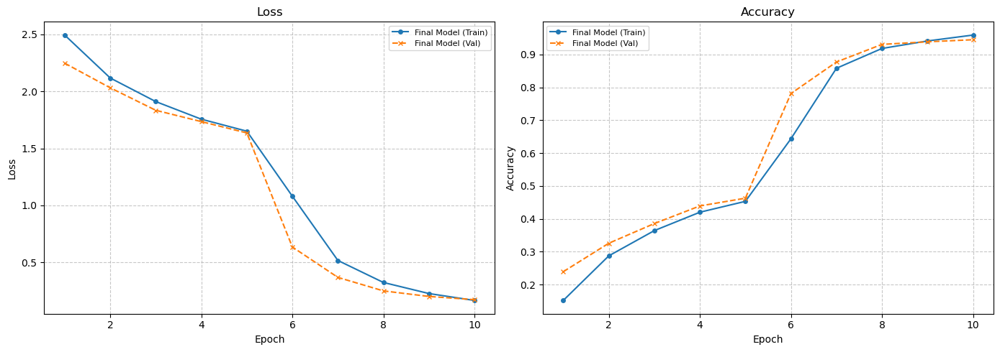

In [20]:
######################################################################################################
#Model Analysis

# create_resnet18_lf
# stratifiedGroupKFold_twostage
######################################################################################################
# ===========================================================
# ITERATION LOG — Improvement Attempt 3
# ===========================================================
# Signal:     ...
# Diagnosis:  ...
# Model: create_resnet18
# Method: Late Fusion, Frozen
# Augmentation: Light, Actor Group
# Action:     EPOCHS = 5.frozon backbone, 5.unfrozon backbone
#
# ===========================================================
#temp added
all_results = {}

best_dropout = 0
best_wd = 0
best_learning_rate = 5e-5

torch.manual_seed(0)
#baseline Aug light
baseline_al = create_resnet18_lf(NUM_CLASSES, dropout_rate=best_dropout).to(device)
    
freeze_backbone(baseline_al)

print('best model trained')
count_params(baseline_al)

#baseline medium
#no drop test this iteration

criterion = nn.CrossEntropyLoss(weight=class_weights)

results, cv_models, cv_loaders = stratifiedKFold_processing_twostage(
    model=baseline_al, 
    name='Final Model', 
    train_df=train_df,                  
    seq_transform=seq_transform,        
    aug_level='light',                  
    p1_epochs=5,           # previous best aug exp had 10 epochs on the frozen backbone 
    p2_epochs=5,          # Number of fine-tuning epochs after unfreezing the backbone
    ft_lr=best_learning_rate,            # after the backbone is unfrozen The fine-tuning learning rate that is very low with 1e-5
    wd=best_wd,               # Start off with 0
    criterion=criterion
)

all_results['Final Model'] = results['CV_Avg']

#configuration list for all trained folds
metrics_config = []

for fold_idx, (fold_model, (fold_train_loader, fold_val_loader)) in enumerate(zip(cv_models, cv_loaders)):
    metrics_config.append({
        'model': fold_model,
        'train_loader': fold_train_loader,
        'val_loader': fold_val_loader,
        'device': device,
        'name': f'Fold {fold_idx + 1}'
    })

        
print_evaluation_metrics(metrics_config)
plot_experiments(all_results)


In [21]:
#Evaluate ensemble of adll folds report


all_preds = []
all_labels = []

#iterate through the folds trained and each of the data loaders
for fold_idx, (trained_model, (train_loader, val_loader)) in enumerate(zip(cv_models, cv_loaders)):
    print(f"evaluating fold {fold_idx + 1} validation data")

    #get current model of the fold in eval mode
    trained_model.eval()

    with torch.inference_mode():
        #iterate through validation loader of the model
        for x, y in val_loader:
            x = x.to(device)

            #fwd pass
            outputs = trained_model(x)
            _, predicted = torch.max(outputs, 1)

            #store batch predictions and true labels as numpys
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(y.numpy())

#convert accumulated list to np arrys
all_preds = np.array(all_preds)
all_labels = np.array(all_labels)

#print classification report
print("\ncross validation performance")
print(classification_report(all_labels, all_preds, target_names=CLASS_NAMES))



evaluating fold 1 validation data
evaluating fold 2 validation data
evaluating fold 3 validation data
evaluating fold 4 validation data
evaluating fold 5 validation data

cross validation performance
                  precision    recall  f1-score   support

        AllClear       0.83      0.88      0.86        51
     HaveCommand       1.00      0.96      0.98        57
           Hover       1.00      1.00      1.00        48
            Land       1.00      1.00      1.00        66
LandingDirection       1.00      1.00      1.00        30
       MoveAhead       1.00      0.97      0.98        59
    MoveDownward       1.00      1.00      1.00        24
      MoveToLeft       0.84      0.91      0.87        57
     MoveToRight       0.90      0.79      0.84        56
      MoveUpward       0.95      1.00      0.98        41
        NotClear       0.89      0.85      0.87        55
        SlowDown       0.95      1.00      0.97        55
         WaveOff       1.00      1.00      1.

In [25]:
#full train best model
# 1. Create a DataLoader using 100% of your training data


#calculate class weights dymnamically on train_df
#get the class weight based on label
unique_classes = np.unique(train_df['gesture'])
class_weights_np = compute_class_weight(
    class_weight='balanced', 
    classes=np.unique(train_df['gesture']), 
    y=train_df['gesture']
)
#convert class weights to 32-bit float tensor
class_weights = torch.tensor(class_weights_np, dtype=torch.float32).to(device)
best_dropout = 0
best_wd = 0
best_learning_rate = 5e-5

full_train_base = GestureSequenceDataset(train_df, transform=seq_transform, aug_level=None)
full_train_aug = GestureSequenceDataset(train_df, transform=seq_transform, aug_level='light')
full_train_ds = ConcatDataset([full_train_base, full_train_aug])
full_train_loader = DataLoader(full_train_ds, batch_size=16, shuffle=True, num_workers=2)

#initialize a fresh best model set up -> Late fusion, best_dropout 
final_model = create_resnet18_lf(NUM_CLASSES, dropout_rate=best_dropout).to(device)
#class_weights cross entropy
criterion = nn.CrossEntropyLoss(weight=class_weights)

print("Training final model on 100% train_df")

#stage 1: Frozen Backbone, learning rate 1e-3
freeze_backbone(final_model)
opt_p1 = optim.Adam(filter(lambda p: p.requires_grad, final_model.parameters()), lr=1e-3)

for epoch in range(5):
    train_loss, train_acc = train_one_epoch(final_model, full_train_loader, opt_p1, criterion)
    print(f"stage 1 - epoch {epoch+1}: loss {train_loss:.4f}, acc {train_acc:.4f}")

#stage 2: Unfrozen Backbone with best learn rate and wd
unfreeze_backbone(final_model)
opt_p2 = optim.Adam(final_model.parameters(), lr=best_learning_rate, weight_decay=best_wd)
scheduler_p2 = CosineAnnealingLR(opt_p2, T_max=5, eta_min=1e-7)

for epoch in range(5):
    train_loss, train_acc = train_one_epoch(final_model, full_train_loader, opt_p2, criterion)
    scheduler_p2.step()
    print(f"stage 2-epoch {epoch+1}: loss {train_loss:.4f}, acc {train_acc:.4f}")




Training final model on 100% train_df
stage 1 - epoch 1: loss 2.4029, acc 0.1709
stage 1 - epoch 2: loss 2.0546, acc 0.3134
stage 1 - epoch 3: loss 1.8357, acc 0.3780
stage 1 - epoch 4: loss 1.6910, acc 0.4323
stage 1 - epoch 5: loss 1.5587, acc 0.4906
stage 2-epoch 1: loss 0.9450, acc 0.6906
stage 2-epoch 2: loss 0.4383, acc 0.8669
stage 2-epoch 3: loss 0.2714, acc 0.9339
stage 2-epoch 4: loss 0.1922, acc 0.9583
stage 2-epoch 5: loss 0.1565, acc 0.9677


In [26]:
#final model Performance Report

eval_ds = GestureSequenceDataset(val_df, transform=seq_transform, aug_level=None)
eval_loader = DataLoader(eval_ds, batch_size=16, shuffle=False, num_workers=2, pin_memory=True)

final_model.eval()

all_preds = []
all_labels = []

#run inference
with torch.inference_mode():
    for x, y in eval_loader:
        x = x.to(device)
        
        #fwd pass
        outputs = final_model(x)
        _, predicted = torch.max(outputs, 1)

        #store batch predictions and true labels as numpys
        all_preds.extend(predicted.cpu().numpy())
        all_labels.extend(y.numpy())

#convert accumulated list to np arrys
all_preds = np.array(all_preds)
all_labels = np.array(all_labels)


#print classification report
print("\n final model Performance Report")
print(classification_report(all_labels, all_preds, target_names=CLASS_NAMES))




 final model Performance Report
                  precision    recall  f1-score   support

        AllClear       1.00      0.85      0.92        13
     HaveCommand       1.00      1.00      1.00        14
           Hover       1.00      1.00      1.00        18
            Land       1.00      1.00      1.00        24
LandingDirection       1.00      1.00      1.00        13
       MoveAhead       0.96      1.00      0.98        23
    MoveDownward       1.00      1.00      1.00        10
      MoveToLeft       0.95      1.00      0.97        19
     MoveToRight       1.00      0.96      0.98        25
      MoveUpward       1.00      1.00      1.00         7
        NotClear       0.82      0.90      0.86        10
        SlowDown       0.95      0.95      0.95        22
         WaveOff       1.00      1.00      1.00        14

        accuracy                           0.98       212
       macro avg       0.98      0.97      0.97       212
    weighted avg       0.98      0.98

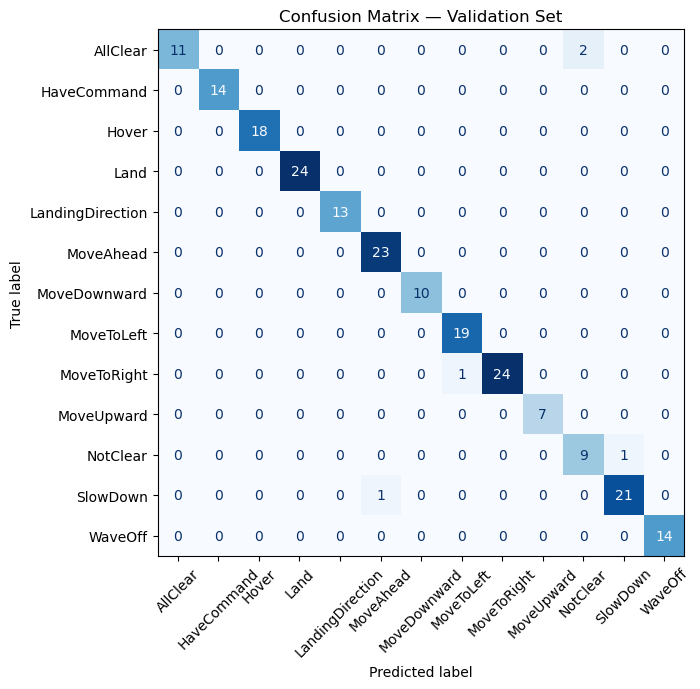

In [27]:
#Confusion Matrix

cm = confusion_matrix(all_labels, all_preds)
fig, ax = plt.subplots(figsize=(8, 7))
disp = ConfusionMatrixDisplay(cm, display_labels=CLASS_NAMES)
disp.plot(ax=ax, xticks_rotation=45, cmap='Blues', colorbar=False)
plt.title('Confusion Matrix — Validation Set')
plt.tight_layout()
plt.show()

Misclassified: 5 / 212 (2.36%)


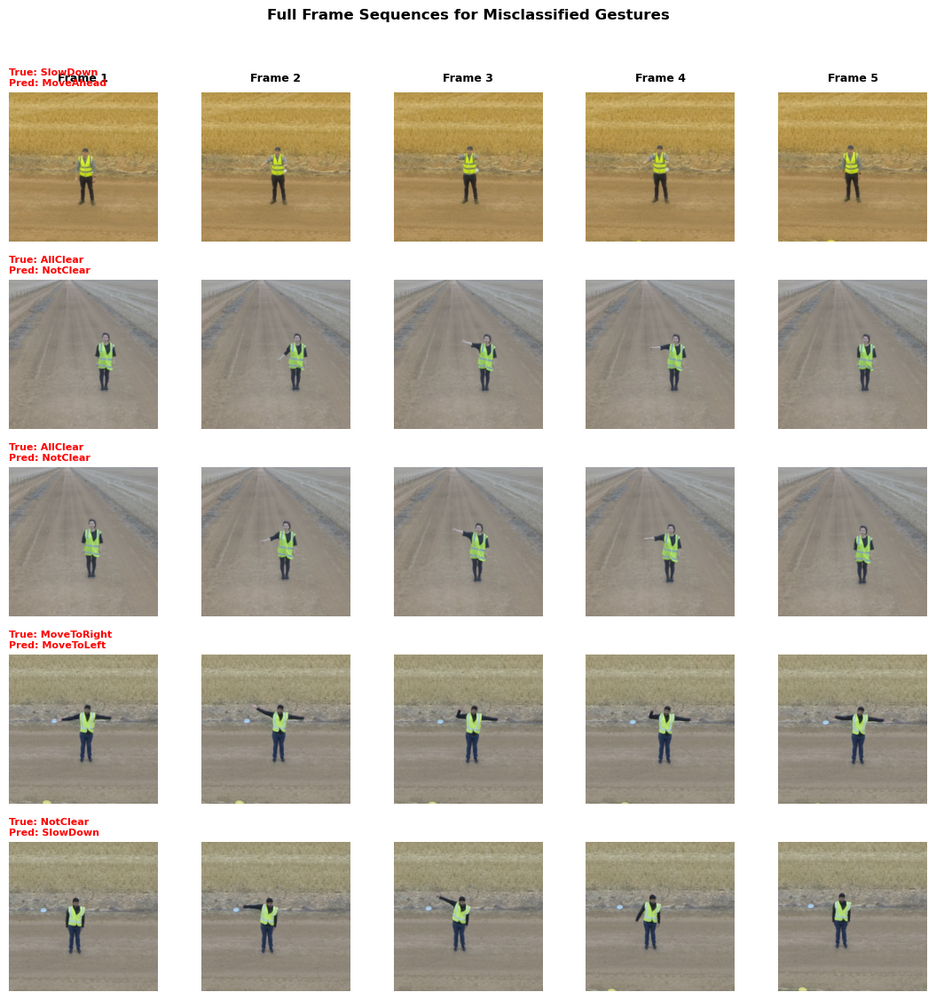

In [30]:


# 1. Identify indices of misclassified instances
errors = np.where(all_preds != all_labels)[0]
num_errors = len(errors)
print(f"Misclassified: {num_errors} / {len(all_labels)} ({num_errors / len(all_labels) * 100:.2f}%)")

if num_errors == 0:
    print("No misclassifications found!")
else:
    # Determine sequence length (T) from the first error sample
    sample_x, _ = eval_ds[errors[0]]
    num_frames = sample_x.shape[0] if sample_x.ndim == 4 else 1

    # ImageNet normalization constants
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])

    # Limit total displayed sequences (e.g., max 8 misclassified gestures)
    n_show = min(8, num_errors)

    # Grid: Rows = Misclassified Instances, Columns = Frames in Sequence
    fig, axes = plt.subplots(n_show, num_frames, figsize=(num_frames * 2.2, n_show * 2.2))
    
    # Ensure axes is always a 2D array [row, col]
    if n_show == 1 and num_frames == 1:
        axes = np.array([[axes]])
    elif n_show == 1:
        axes = np.expand_dims(axes, axis=0)
    elif num_frames == 1:
        axes = np.expand_dims(axes, axis=1)

    for row in range(n_show):
        err_idx = errors[row]
        x_data, _ = eval_ds[err_idx]
        
        # Standardize 3D tensor (C, H, W) to 4D sequence (1, C, H, W) if necessary
        if x_data.ndim == 3:
            x_data = x_data.unsqueeze(0)

        true_label = CLASS_NAMES[all_labels[err_idx]]
        pred_label = CLASS_NAMES[all_preds[err_idx]]

        for col in range(num_frames):
            ax = axes[row, col]
            
            # Extract individual frame tensor (C, H, W)
            img_tensor = x_data[col]
            img_np = img_tensor.cpu().permute(1, 2, 0).numpy()
            
            # Reverse ImageNet normalization
            img_np = std * img_np + mean
            img_np = np.clip(img_np, 0, 1)

            ax.imshow(img_np)
            ax.axis('off')

            # Show classification labels on the left frame of each sequence
            if col == 0:
                ax.set_title(f"True: {true_label}\nPred: {pred_label}", 
                             fontsize=8, color='red', fontweight='bold', loc='left')
            
            # Label frame indices at the top of the first row
            if row == 0:
                ax.text(0.5, 1.08, f"Frame {col + 1}", transform=ax.transAxes, 
                        ha='center', fontsize=9, fontweight='bold')

    plt.suptitle('Full Frame Sequences for Misclassified Gestures', fontsize=12, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.show()

In [31]:
#evaluate function to see the average loss and the accuracy for the ds
def evaluate(model, dataloader, criterion, device):
    model.eval()
    total_loss = 0.0
    correct = 0
    total_samples = 0
    
    with torch.inference_mode():
        for x, y in dataloader:
            x, y = x.to(device), y.to(device)
            outputs = model(x)
            loss = criterion(outputs, y)
            
            total_loss += loss.item() * x.size(0)
            _, predicted = torch.max(outputs, 1)
            correct += (predicted == y).sum().item()
            total_samples += y.size(0)
            
    avg_loss = total_loss / total_samples
    accuracy = correct / total_samples
    return avg_loss, accuracy

#accuracy threshold
TARGET_VALUE = 0.90 

#setup ds using test_df and  GestureSequenceDataset
test_ds = GestureSequenceDataset(test_df, transform=seq_transform, aug_level=None)

#set up dataloader
test_loader = DataLoader(
    test_ds, 
    batch_size=16, 
    shuffle=False, 
    num_workers=2, 
    pin_memory=True
)

#run evaluation 
eval_criterion = nn.CrossEntropyLoss()
test_loss, test_acc = evaluate(final_model, test_loader, eval_criterion, device)

#print Summary report
print('=' * 60)
print('FINAL TEST SET EVALUATION')
print('=' * 60)
print(f'Test Accuracy: {test_acc:.4f}')
print(f'Test Loss:     {test_loss:.4f}')
print(f'Target:        {TARGET_VALUE:.4f}')
print(f'Status:        {"✅ TARGET MET" if test_acc >= TARGET_VALUE else "❌ Below target"}')
print('=' * 60)

FINAL TEST SET EVALUATION
Test Accuracy: 0.9670
Test Loss:     0.1302
Target:        0.9000
Status:        ✅ TARGET MET


best model trained
  Trainable: 6,669 / 11,183,181 (0.06%)

Target fold 1/5
  > Phase 1: Probing (5 epochs)
  [Final Model_Fold_1_P1] Epoch 1/5 — Train Loss: 2.4385, Train Acc: 0.1585 | Val Loss: 2.4782, Val Acc: 0.1370
  [Final Model_Fold_1_P1] Epoch 2/5 — Train Loss: 2.0827, Train Acc: 0.2935 | Val Loss: 2.3465, Val Acc: 0.2740
  [Final Model_Fold_1_P1] Epoch 3/5 — Train Loss: 1.8699, Train Acc: 0.3589 | Val Loss: 2.2540, Val Acc: 0.1849
  [Final Model_Fold_1_P1] Epoch 4/5 — Train Loss: 1.7418, Train Acc: 0.4192 | Val Loss: 2.2039, Val Acc: 0.2192
  [Final Model_Fold_1_P1] Epoch 5/5 — Train Loss: 1.5992, Train Acc: 0.4785 | Val Loss: 2.1563, Val Acc: 0.2808
  > Phase 2: Fine-Tuning (5 epochs)
  [Final Model_Fold_1_P2] Epoch 1/5 — Train Loss: 1.0227, Train Acc: 0.6667 | Val Loss: 1.2036, Val Acc: 0.5479
  [Final Model_Fold_1_P2] Epoch 2/5 — Train Loss: 0.5406, Train Acc: 0.8323 | Val Loss: 1.0047, Val Acc: 0.6438
  [Final Model_Fold_1_P2] Epoch 3/5 — Train Loss: 0.3408, Train Acc: 0.9

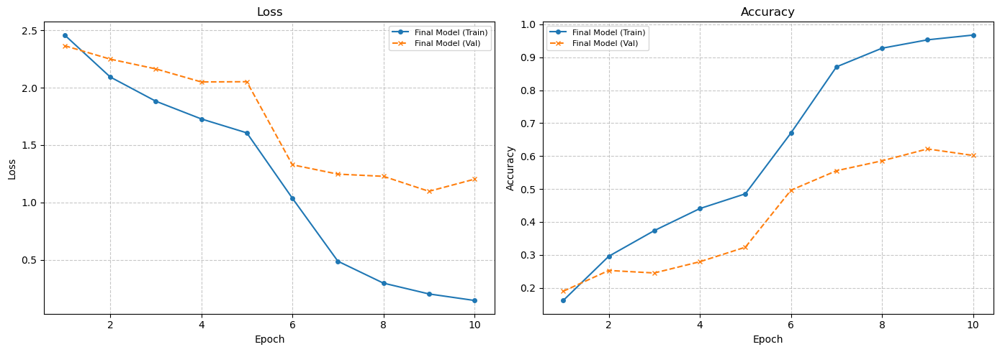

In [24]:
######################################################################################################
# apply best augmentation with kfold Stratification with Actor Group, 

# create_resnet18_lf
# stratifiedGroupKFold_twostage with best settings
######################################################################################################
# ===========================================================
# ITERATION LOG — Improvement Attempt 3
# ===========================================================
# Signal:     ...
# Diagnosis:  ...
# Model: create_resnet18
# Method: Late Fusion, Frozen
# Augmentation: Light, Actor Group
# Action:     EPOCHS = 5.frozon backbone, 5.unfrozon backbone
#
# ===========================================================
#temp added
all_results = {}

best_dropout = 0
best_wd = 0
best_learning_rate = 5e-5

torch.manual_seed(0)
#baseline Aug light
baseline_al = create_resnet18_lf(NUM_CLASSES, dropout_rate=best_dropout).to(device)
    
freeze_backbone(baseline_al)

print('best model trained')
count_params(baseline_al)

#baseline medium
#no drop test this iteration

criterion = nn.CrossEntropyLoss(weight=class_weights)

results, cv_models, cv_loaders = stratifiedGroupKFold_twostage(
    model=baseline_al, 
    name='Final Model', 
    train_df=train_df,                  
    seq_transform=seq_transform,        
    aug_level='light',                  
    p1_epochs=5,           # previous best aug exp had 10 epochs on the frozen backbone 
    p2_epochs=5,          # Number of fine-tuning epochs after unfreezing the backbone
    ft_lr=best_learning_rate,            # after the backbone is unfrozen The fine-tuning learning rate that is very low with 1e-5
    wd=best_wd,               # Start off with 0
    criterion=criterion
)

all_results['Final Model'] = results['CV_Avg']

#configuration list for all trained folds
metrics_config = []

for fold_idx, (fold_model, (fold_train_loader, fold_val_loader)) in enumerate(zip(cv_models, cv_loaders)):
    metrics_config.append({
        'model': fold_model,
        'train_loader': fold_train_loader,
        'val_loader': fold_val_loader,
        'device': device,
        'name': f'Fold {fold_idx + 1}'
    })

        
print_evaluation_metrics(metrics_config)
plot_experiments(all_results)


In [ ]:
######################################################################################################
#7.6 apply best augmentation with kfold Stratification no actor based group

#transform learning - standard - aug_level='light' with kfold Stratification based on group

#create_resnet18_lf
#stratifiedKFold_processing_twostage

######################################################################################################

next_results = {}
#add the best augmentation variant
next_results['v1: Linear Probing Aug strong'] = all_results['v1: Linear Probing Aug strong']


torch.manual_seed(0)
#baseline Aug light
baseline_al = create_resnet18_lf(NUM_CLASSES).to(device)
freeze_backbone(baseline_al)

print('Step 1: Linear Probing with Medium Augmentation')
count_params(baseline_al)

#baseline medium
#no drop test this iteration

criterion = nn.CrossEntropyLoss(weight=class_weights)

results, cv_models, cv_loaders = stratifiedKFold_processing_twostage(
    model=baseline_al, 
    name='v1b: Fine-Tuning_LR_1e-5', 
    train_df=train_df,                  
    seq_transform=seq_transform,        
    aug_level='light',                  
    p1_epochs=10,           # previous best aug exp had 10 epochs on the frozen backbone 
    p2_epochs=10,          # Number of fine-tuning epochs after unfreezing the backbone
    ft_lr=1e-5,            # after the backbone is unfrozen The fine-tuning learning rate that is very low with 1e-5
    wd=0,               # Start off with 0
    criterion=criterion
)

next_results['v1b: Fine-Tuning_LR_1e-5_AL_GSKF'] = results['CV_Avg']

#configuration list for all trained folds
metrics_config = []

for fold_idx, (fold_model, (fold_train_loader, fold_val_loader)) in enumerate(zip(cv_models, cv_loaders)):
    metrics_config.append({
        'model': fold_model,
        'train_loader': fold_train_loader,
        'val_loader': fold_val_loader,
        'device': device,
        'name': f'Fold {fold_idx + 1}'
    })

        
print_evaluation_metrics(metrics_config)
plot_experiments(next_results)


Step 1: Linear Probing with Medium Augmentation
  Trainable: 6,669 / 11,183,181 (0.06%)

Target fold 1/5
  > Phase 1: Probing (10 epochs)


In [ ]:
######################################################################################################
#7.3 Step 2: Transfer learning with a small learning rate
######################################################################################################

unfreeze_backbone(baseline)

print('\nStep 2: Fine-Tuning')
count_params(baseline)

optimizer = optim.Adam(baseline.parameters(), lr=1e-5)

all_results['v1b: Fine-Tuning'] = run_experiment(
    baseline, optimizer, criterion, train_loader, val_loader,
    epochs=2, name='v1b: Fine-Tune'
)

plot_experiments(all_results)

best_val = max(all_results['v1b: Fine-Tuning']['val_acc'])
print(f'\nBaseline val accuracy: {best_val:.4f} | Target: {TARGET_VALUE:.4f} | '
      f'{"✅ TARGET MET" if best_val >= TARGET_VALUE else "❌ Below target — analyse and improve"}')

In [ ]:
######################################################################################################################################
#Improvement Attempt 3: 
#Baseline with Best Augementation and kfold Stratification based on group
#Regularisation + Tuning - learning rate, batch size, and dropout rate for training the new head
######################################################################################################################################

In [ ]:
######################################################################################################
#Tune Phase 1 Hyperparameters - learning rate, batch size, and dropout rate for training the new head
######################################################################################################
# ============================================
# ITERATION LOG — Improvement Attempt 3
# ============================================
# Signal:     ...
# Diagnosis:  ...
# Action:     Adding weight decay + tuning its value
# ============================================







Step 2: Fine-Tuning
  Trainable: 11,183,181 / 11,183,181 (100.00%)
  [v1b: Fine-Tune] Epoch 1/10 — Train Loss: 1.8236, Train Acc: 0.4000 | Val Loss: 1.4692, Val Acc: 0.6047
  [v1b: Fine-Tune] Epoch 2/10 — Train Loss: 1.4862, Train Acc: 0.6000 | Val Loss: 1.1921, Val Acc: 0.7559
  [v1b: Fine-Tune] Epoch 4/10 — Train Loss: 1.0608, Train Acc: 0.8047 | Val Loss: 0.8150, Val Acc: 0.8850
  [v1b: Fine-Tune] Epoch 6/10 — Train Loss: 0.7557, Train Acc: 0.8976 | Val Loss: 0.5546, Val Acc: 0.9449
  [v1b: Fine-Tune] Epoch 8/10 — Train Loss: 0.5441, Train Acc: 0.9559 | Val Loss: 0.3724, Val Acc: 0.9748
  [v1b: Fine-Tune] Epoch 10/10 — Train Loss: 0.4086, Train Acc: 0.9685 | Val Loss: 0.2563, Val Acc: 0.9969


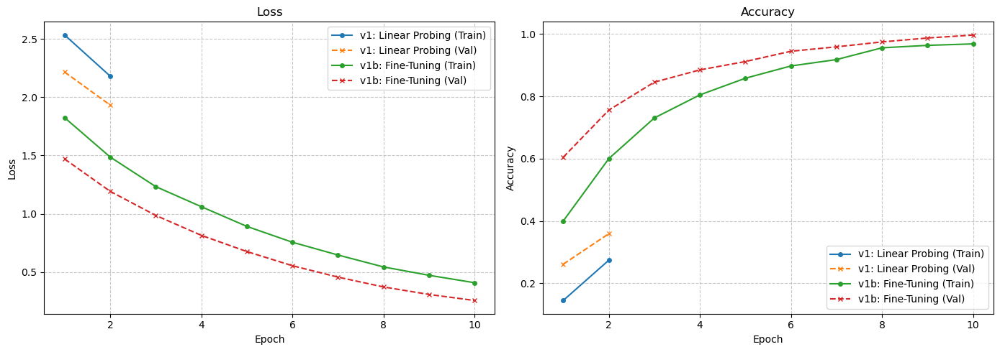


Baseline val accuracy: 0.9969 | Target: 0.8800 | ✅ TARGET MET


In [ ]:
######################################################################################################
#Tune Phase 2 Hyperparameters different fine-tuning learning rates, unfreezing only specific layers
######################################################################################################

In [ ]:
######################################################################################################
#Run the test on the end model and report
######################################################################################################

In [ ]:
references:
@misc{he2015deepresiduallearningimage,
      title={Deep Residual Learning for Image Recognition}, 
      author={Kaiming He and Xiangyu Zhang and Shaoqing Ren and Jian Sun},
      year={2015},
      eprint={1512.03385},
      archivePrefix={arXiv},
      primaryClass={cs.CV},
      url={https://arxiv.org/abs/1512.03385}, 
}

@inbook{zhang2024resnet,
  author    = {Aston Zhang and Zachary C. Lipton and Mu Li and Alexander J. Smola},
  title     = {Residual Networks (ResNet) and ResNeXt},
  booktitle = {Dive into Deep Learning},
  year      = {2024},
  publisher = {Cambridge University Press},
  url       = {https://d2l.ai/chapter_convolutional-modern/resnet.html},
  note      = {Accessed: 2026-08-30}
}

@article{Mullamuri2025MacroF1,
  author  = {Sushma Mullamuri},
  title   = {Understanding the Macro F1-Score in Multi-Class Classification},
  journal = {Medium},
  year    = {2025},
  month   = aug,
  day     = {5},
  url     = {https://medium.com/@sushma.mullamuri420/understanding-the-macro-f1-score-in-multi-class-classification-21ca00c200da}
}